# <div class="alert-success">Hotel Customer Segmentation

This analysis is conducted as part of the "Business Cases with Data Science" course, a component of the Master's program in Data Science and Advanced Analytics at the Nova Information Management School. It addresses an issue identified by a new marketing manager within the Portuguese hotel industry. The current method of customer segmentation relies solely on sales origin and overlooks key factors such as geography, demographics, and behavior, hindering effective marketing strategies for both attracting new guests and retaining existing ones.

- `Objective`: Develop a new customer segmentation strategy by incorporating a broader range of customer characteristics. This strategy aims to optimize and refine marketing strategies, enabling more targeted methods of attracting and retaining guests.

- The dataset used in this analysis focuses on individual hotel guests. Each row represents a unique guest, and each column represents guest characteristics

Group V 2023/2024: 
- Pedro Catarro, 20230463
</div>

In [4]:
# Importing Libraries

import os
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns
import math
from math import ceil
import plotly.graph_objects as go
import matplotlib.ticker as mtick
import matplotlib.cm as cm
from scipy.stats import chi2_contingency
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
import missingno as msno
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import InterclusterDistance
from sklearn.metrics import r2_score

In [5]:
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names", category=UserWarning)
warnings.filterwarnings("ignore", message="The default value of `normalized_stress` will change", category=FutureWarning)

In [6]:
pd.set_option('display.max_columns', None)

`Note` The markdown 'customizations' have this source: https://www.ibm.com/docs/en/watson-studio-local/1.2.3?topic=notebooks-markdown-jupyter-cheatsheet

<a id = "Index"></a>

## CRISP-DM Index
1. [Data Understanding](#Data-Understanding)
2. [Data Preparation](#Data-Preparation)
3. [Modelling: K-Means](#Data-Modeling:KM)
4. [Evaluation](#Evaluation)
5. [Deployment](#Deployment)

<a id = "Data-Understanding"></a>
    
## 1. Data Understanding

[1.1 Data Loading and Description](#Data-Loading-and-Description)

[1.2 Exploratory Data Analysis](#EDA)

 - [1.2.1. Data Types](#Data-Types)

 - [1.2.2. Univariate EDA: Descriptive Summary](#Descriptive-Summary)
 
 - [1.2.3. Univariate EDA: Missing Values](#Missing-Values)

 - [1.2.4. Univariate EDA: Data Visualization](#Univariate-Vizualization)
 
 - [1.2.5. Bivariate EDA: Data Visualization](#Bivariate-Vizualization) 
 
 - [1.2.6. Multvariate EDA: Duplicates](#Multivariate) 
 

<a id = "Data-Loading-and-Description"></a>
### 1.1. Data Loading and Description

[Back to Index](#Index)

In [7]:
#dataframe with the Case1_HotelCustomerSegmentation.csv source and defining the index
ds = pd.read_csv('Case1_HotelCustomerSegmentation.csv', sep = ';')
ds.head(10)

,ID,Nationality,Age,DaysSinceCreation,NameHash,DocIDHash,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
0,1,PRT,52.0,440,0x2C371FD6CE12936774A139FD7430C624F1C4D5109CE6...,0x434FD3D59469C73AFEA087017FAF8CA2296493AEABDE...,59,292.0,82.3,1,0,2,6,4,Corporate,Corporate,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,PRT,NaN,1385,0x198CDB98BF37B6E23F9548C56A88B00912D65A9AA0D6...,0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B...,61,280.0,53.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3,DEU,32.0,1385,0xDA46E62F66936284DF2844EC4FC542D0DAD780C0EE0C...,0x27F5DF762CCDA622C752CCDA45794923BED9F1B66300...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,FRA,61.0,1385,0xC45D4CD22C58FDC5FD0F95315F6EFA5A6E7149187D49...,0x8E59572913BB9B1E6CAA12FA2C8B7BF387B1D1F3432E...,93,240.0,60.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
4,5,FRA,52.0,1385,0xD2E3D5BFCA141865669F98D64CDA85AD04DEFF47F8A0...,0x42BDEE0E05A9441C94147076EDDCC47E604DA5447DD4...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
5,6,JPN,55.0,1385,0xA3CF1A4692BE0A17CFD3BFD9C07653556BDADF5F4BE7...,0x506065FBCE220DCEA4465C7310A84F04165BCB5906DC...,58,230.0,24.0,0,0,1,4,2,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
6,7,JPN,50.0,1385,0x94DB830C90A6DA2331968CFC9448AB9A3CE07D7CFEDD...,0x47E5E4B21585F1FD956C768E730604241B380EDFEA68...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
7,8,FRA,33.0,1385,0x165B609162C92BF563E96DB03539363F07E784C219A8...,0x6BB66BA80C726B9967988A889D83699B609D11C65AD7...,38,535.0,94.0,0,0,1,10,5,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
8,9,FRA,43.0,1385,0x44BB41EF2D87698E75B6FBB77A8815BF48DAA912C140...,0x6C456E45A78A20BC794137AE326A81D587B6528B3944...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
9,10,IRL,26.0,1385,0x9BEECEE0C18B0957C7424443643948E99A0EC8326EF9...,0x199C61A5442D08987001E170B74D244DF6AF1FC9AE92...,96,174.0,69.0,0,0,1,6,3,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0


In [8]:
ds['ID'].nunique()

111733

In [9]:
#Lets see the shape of the Datset (rows and columns respectively)
ds.shape

(111733, 29)

The dataset we are going to use has 111733 customer instances and 28 descriptive variables. And the uniques are all unique, so we can use that as an index.

In [10]:
ds.set_index('ID', inplace = True)
ds.head(10)

,Nationality,Age,DaysSinceCreation,NameHash,DocIDHash,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,PRT,52.0,440,0x2C371FD6CE12936774A139FD7430C624F1C4D5109CE6...,0x434FD3D59469C73AFEA087017FAF8CA2296493AEABDE...,59,292.0,82.3,1,0,2,6,4,Corporate,Corporate,0,0,0,0,0,0,0,0,0,0,0,0,0
2,PRT,NaN,1385,0x198CDB98BF37B6E23F9548C56A88B00912D65A9AA0D6...,0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B...,61,280.0,53.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
3,DEU,32.0,1385,0xDA46E62F66936284DF2844EC4FC542D0DAD780C0EE0C...,0x27F5DF762CCDA622C752CCDA45794923BED9F1B66300...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
4,FRA,61.0,1385,0xC45D4CD22C58FDC5FD0F95315F6EFA5A6E7149187D49...,0x8E59572913BB9B1E6CAA12FA2C8B7BF387B1D1F3432E...,93,240.0,60.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
5,FRA,52.0,1385,0xD2E3D5BFCA141865669F98D64CDA85AD04DEFF47F8A0...,0x42BDEE0E05A9441C94147076EDDCC47E604DA5447DD4...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
6,JPN,55.0,1385,0xA3CF1A4692BE0A17CFD3BFD9C07653556BDADF5F4BE7...,0x506065FBCE220DCEA4465C7310A84F04165BCB5906DC...,58,230.0,24.0,0,0,1,4,2,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
7,JPN,50.0,1385,0x94DB830C90A6DA2331968CFC9448AB9A3CE07D7CFEDD...,0x47E5E4B21585F1FD956C768E730604241B380EDFEA68...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
8,FRA,33.0,1385,0x165B609162C92BF563E96DB03539363F07E784C219A8...,0x6BB66BA80C726B9967988A889D83699B609D11C65AD7...,38,535.0,94.0,0,0,1,10,5,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
9,FRA,43.0,1385,0x44BB41EF2D87698E75B6FBB77A8815BF48DAA912C140...,0x6C456E45A78A20BC794137AE326A81D587B6528B3944...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0


In [11]:
ds1 = ds.copy()

We are going to use a copy of the original Df to make the necessary modifications from now on: "Modifications to the data or indices of the copy will not be reflected in the original object" Source: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.copy.html

<a id = "EDA"></a>
    
### 1.2 Exploratory Data Analysis

[Back to Index](#Index)

<a id = "Data-Types"></a>
    
### 1.2.1. Data Types

In [12]:
#Checking the variable types
ds1.dtypes

Nationality              object
Age                     float64
DaysSinceCreation         int64
NameHash                 object
DocIDHash                object
AverageLeadTime           int64
LodgingRevenue          float64
OtherRevenue            float64
BookingsCanceled          int64
BookingsNoShowed          int64
BookingsCheckedIn         int64
PersonsNights             int64
RoomNights                int64
DistributionChannel      object
MarketSegment            object
SRHighFloor               int64
SRLowFloor                int64
SRAccessibleRoom          int64
SRMediumFloor             int64
SRBathtub                 int64
SRShower                  int64
SRCrib                    int64
SRKingSizeBed             int64
SRTwinBed                 int64
SRNearElevator            int64
SRAwayFromElevator        int64
SRNoAlcoholInMiniBar      int64
SRQuietRoom               int64
dtype: object

- `Categorical Variables`: `Nationality`; `NameHash`; `DocIDHash`; `DistributionChannel`; `MarketSegment`
- `Numeric variables`: `Age` *(Customer's age (in years) at the day of the extraction period)*; `DaysSinceCreation`; `AverageLeadTime` *(average number of days between the customer's booking date and arrival date)*; `LodgingRevenue`; `OtherRevenue` *(Food, spa...)*; `BookingsCanceled`; `BookingsNoShowed`; `BookingsCheckedIn`; `PersonsNights`; `RoomNights`;
- `Boolean (0: No, 1: Yes)`: SRHighFloor; SRLowFloor; SRAccessibleRoom; SRMediumFloor; SRBathtub; SRShower; SRCrib; SRKingSizeBed; SRTwinBed; SRNearElevator; SRAwayFromElevator; SRNoAlcoholInMiniBar; SRQuietRoom;

The data types are correct. 

<a id = "Descriptive-Summary"></a>

### 1.2.2. Univariate EDA: Descriptive Summary 

[Back to Index](#Index)

In [13]:
pd.set_option('display.max_columns', None) #to lets us view all the variables (code from chatgpt)
# Summary statistics
ds1.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Nationality,111733,199,FRA,16516,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,107561.0,NaN,NaN,NaN,45.639191,17.244952,-10.0,33.0,47.0,58.0,123.0
DaysSinceCreation,111733.0,NaN,NaN,NaN,595.026599,374.657382,36.0,288.0,522.0,889.0,1385.0
NameHash,111733,107584,0x15A713CE687991691A18F6CDC56ABE24979C73CF5D51...,75,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DocIDHash,110732,103480,0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B...,3032,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AverageLeadTime,111733.0,NaN,NaN,NaN,60.833147,85.11532,-1.0,0.0,21.0,95.0,588.0
LodgingRevenue,111733.0,NaN,NaN,NaN,283.851283,379.131556,0.0,0.0,208.0,393.3,21781.0
OtherRevenue,111733.0,NaN,NaN,NaN,64.682802,123.580715,0.0,0.0,31.0,84.0,8859.25
BookingsCanceled,111733.0,NaN,NaN,NaN,0.002282,0.080631,0.0,0.0,0.0,0.0,15.0
BookingsNoShowed,111733.0,NaN,NaN,NaN,0.0006,0.028217,0.0,0.0,0.0,0.0,3.0


Quality assessment: 

- `Nationality`: high-cardinality column (a lot of unique values) slows down the model training of our K-means approach- we need to preprocess this grouping according to regions before the one-hot encoding (transform into a numeric variable) bc of the Curse of Dimensionality. The biggest goup of clients are french. 
- `Age`: Has negative values and the maximum of 123 its not possible (literally https://pt.wikipedia.org/wiki/Lista_das_pessoas_mais_velhas_do_mundo) , this can happen if the previous system has manual fill in and lead to imputation erros. Has `missing values`.
- `NameHash` and `DocIDHash`: are hash strings to assure privacy. The repeated Ids can be from clients that never show up and get attributed a standard DocIDHash (delve deep into this bc needs to be treated as a `missing value`) and also some duplicates. 
- `AverageLeadTime`: negative min value that needs to be adressed. 
-  `LodgingRevenue` and `OtherRevenue` have `outliers`, their maximuns are really hight compare to the mean and even 75th percentile values. This suggest that a small number (or one) of clients spent significantly more at the hotel than others, possibly corporate clients or large groups. These outliers can skew summary statistics like the average and quartiles, potentially giving a misleading picture of typical revenue.
- `BookingsCheckedIn`; `PersonsNights`; `RoomNights`: significant difference between the 3rd quartile and the maximum value - highly skewed distributions indicator
- `DistributionChannel`: majority from Travel Agent/Operator
- `MarketSegment`: seems that they are currently using 7 segments, if it is possible we want to reduce this, its more effective for the marketing efforts. The majority of the customers are from the segment 'Other' (just the for name  we can anticipate a possible lack of specificity and may suggest that most clients are grouped into a single, undifferentiated category, while the remaining are divided into 6 different segments. This could be inefficient for our marketing strategies, but we'll investigate further. - `Call for action argument`

<a id = "Missing-Values"></a>

### 1.2.3. Univariate EDA: Missing Values

[Back to Index](#Index)

In [14]:
#Checking missing values - Code adapted from ChatGpt
missing_values = pd.concat([ds1.isnull().sum(), 100 * ds1.isnull().mean()], axis=1)
missing_values.columns = ['Total', 'Percentage']
missing_values.sort_values(by=['Total', 'Percentage'], ascending=False, inplace=True)
missing_values

,Total,Percentage
Age,4172,3.733901
DocIDHash,1001,0.895886
Nationality,0,0.000000
DaysSinceCreation,0,0.000000
NameHash,0,0.000000
AverageLeadTime,0,0.000000
LodgingRevenue,0,0.000000
OtherRevenue,0,0.000000
BookingsCanceled,0,0.000000
BookingsNoShowed,0,0.000000


Missing values assessment: 

- `Nationality`: its possible that in cases where the person dont show up they insert a default value (for example Portuguese). We can investigate that if we detect a hight number of certain nationality in a person that dont show up and has the default id. 
- [x] `Age` has  
- [x] `DocIDHash` has 
The hotel only can confirm the customer personal details, such as nationality, identification card number, and age... after a customer's first stay - example booking does not give the direct info of the customers so the hotels cant contact the guest directly and give a small discount to the guest instead of given the comission to the channel. 

In [15]:
# Find the most repeated 'DocIDHash' to check if its related to customers that never check in 
ds1['DocIDHash'].value_counts().idxmax()

'0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855'

In [16]:
total_missing_age = ds1['Age'].isnull().sum()
total_missing_docid = ds1['DocIDHash'].isnull().sum()
total_most_repeated_docid = (ds1['DocIDHash'] == '0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855').sum()

In [17]:
# See if the persons with the missing Age ever stayed at the hotel
missing_age_nocheckin = ((ds1['Age'].isnull()) & (ds1['BookingsCheckedIn'] == 0)).sum()

# same for'DocIDHash' 
missing_docid_nocheckin = ((ds1['DocIDHash'].isnull()) & (ds1['BookingsCheckedIn'] == 0)).sum()

# Calculate the number of missing values for the most repeated 'DocIDHash' value associated with customers who never checked in
specific_docid_missing_nocheckin = ((ds1['DocIDHash'] == '0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855') & (ds1['BookingsCheckedIn'] == 0)).sum()

percentage_age_nocheckin = (missing_age_nocheckin / total_missing_age) * 100
percentage_docid_nocheckin = (missing_docid_nocheckin / total_missing_docid) * 100
percentage_specific_docid_nocheckin = (specific_docid_missing_nocheckin / total_most_repeated_docid) * 100

data = {
    'Variable': ['Age Missing values', 'DocIDHash Missing values', 'Most Repeated DocIDHash'],
    'Total': [total_missing_age, total_missing_docid, total_most_repeated_docid],
    'Never Check-in': [missing_age_nocheckin, missing_docid_nocheckin, specific_docid_missing_nocheckin],
    'Never Check-in (%)': [percentage_age_nocheckin, percentage_docid_nocheckin, percentage_specific_docid_nocheckin]
}

missing_values_table = pd.DataFrame(data)
missing_values_table
#adapted from chat GPT request

,Variable,Total,Never Check-in,Never Check-in (%)
0,Age Missing values,4172,1125,26.965484
1,DocIDHash Missing values,1001,997,99.600400
2,Most Repeated DocIDHash,3032,128,4.221636


Almost all (aprox 100%) of the missing values in DocIDHash never stayed ate the hotel and 27% of the Age missing values never did as well.
The default DocIDHash has some correspondents but we need to treat this in the data preparation phase.

We also want to try understood if this situation is derived for a past pratice (the hotel did not consistently strt recording the customer info until recently)

In [18]:
# mean and median of 'DaysSinceCreation' for the entire dataset
mean_days_since_creation = ds1['DaysSinceCreation'].mean()
median_days_since_creation = ds1['DaysSinceCreation'].median()

missing_age = ds1['Age'].isnull()
missing_docid = ds1['DocIDHash'].isnull()
specific_docid = ds1['DocIDHash'] == '0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855'

mean_values = [
    ds1.loc[missing_age, 'DaysSinceCreation'].mean(),
    ds1.loc[missing_docid, 'DaysSinceCreation'].mean(),
    ds1.loc[specific_docid, 'DaysSinceCreation'].mean()
]

median_values = [
    ds1.loc[missing_age, 'DaysSinceCreation'].median(),
    ds1.loc[missing_docid, 'DaysSinceCreation'].median(),
    ds1.loc[specific_docid, 'DaysSinceCreation'].median()
]

# Checking if the means and medians are above the overall mean and median
above_mean = [mean > mean_days_since_creation for mean in mean_values]
above_median = [median > median_days_since_creation for median in median_values]

data = {
    'Variable': ['Age Missing values', 'DocIDHash Missing values', 'Most Repeated DocIDHash'],
    'Mean Days Since Creation': mean_values,
    'Median Days Since Creation': median_values,
    'Above Mean': above_mean,
    'Above Median': above_median
}

mean_median_values_table = pd.DataFrame(data)
mean_median_values_table

#Adapted from chat GPT request

,Variable,Mean Days Since Creation,Median Days Since Creation,Above Mean,Above Median
0,Age Missing values,826.881831,842.0,True,True
1,DocIDHash Missing values,454.626374,461.0,False,False
2,Most Repeated DocIDHash,939.059367,1022.0,True,True


The observation that records with missing age values and occurrences of the most repeated 'DocIDHash' tend to have been created earlier than the average could indicate a shift in data recording practices over time. This suggests that in the past, there may have been instances where customer data, such as age, was not consistently recorded, resulting in missing values. Similarly, the repeated occurrence of a specific 'DocIDHash' could imply the use of a default ID for certain records, a practice that may have been more common in the past.

DocIDHash Missing values are more recent but we already saw that they are from customers that never stayed at the hotel. 

<a id = "Univariate-Vizualization"></a>

### 1.2.4. Univariate EDA: Data Visualization

- [Numeric variables: Histograms](#Histograms)
- [Numeric variables: Box Plots](#BoxPlots)
- [Categorical variables: Bar Plots](#BarPlots)
- [Categorical variables: Geographic Map](#GeographicMap)
- [Boolean variables](#Boolean)

[Back to Index](#Index)

Defining the variables by types using lists so we can use that later

In [19]:
# Let's create a total revenue column to explore some correlations in this phase. We can add it to the ds1 dataframe in the feature engineering part if necessary and applicable.
ds_EDA = ds1.copy()

In [20]:
numeric_vars = ['Age', 'DaysSinceCreation', 'AverageLeadTime', 'LodgingRevenue', 
                'OtherRevenue', 'BookingsCanceled', 'BookingsNoShowed', 
                'BookingsCheckedIn', 'PersonsNights', 'RoomNights']

In [21]:
categorical_vars = ['Nationality', 'DistributionChannel', 'MarketSegment'] #leaving NameHash and DocIdHash bc they aim to identify, not to characterize

In [22]:
boolean_vars = ['SRHighFloor', 'SRLowFloor', 'SRAccessibleRoom', 'SRMediumFloor', 
                'SRBathtub', 'SRShower', 'SRCrib', 'SRKingSizeBed', 'SRTwinBed', 
                'SRNearElevator', 'SRAwayFromElevator', 'SRNoAlcoholInMiniBar', 
                'SRQuietRoom']

<a id = "Histograms"></a>

#### Numeric variables: Histograms

[Back to Univariate EDA: Data Visualization](#Univariate-Vizualization)

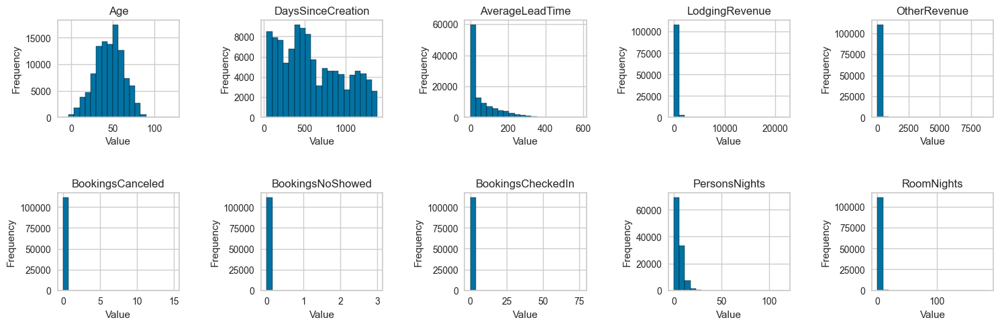

In [23]:
fig, axes = plt.subplots(2, 5, figsize=(16, 6))
fig.tight_layout(pad=5.0)

for i, var in enumerate(numeric_vars):
    row = i // 5
    col = i % 5
    axes[row, col].hist(ds_EDA[var], bins=20, edgecolor='black')
    axes[row, col].set_title(var)
    axes[row, col].set_xlabel('Value')
    axes[row, col].set_ylabel('Frequency')

plt.show()

#Adapted from previous notebook

- `Age` has a pick in the middle age indicating a possible pattern (people with more money, still have will to travel and desire more confort);
- `DaysSinceCreation` we have more recent records
- `AverageLeadTime`; `LodgingRevenue`; `OtherRevenue`; `BookingsCheckedIn`; `PersonsNights`; `RoomNights` seem to have outliers, we are going to complement this information with Box-Plots.
- `BookingsCanceled` and `BookingsNoShowed` seem to be rare.

<a id = "BoxPlots"></a>

#### Numeric variables: Box Plots

[Back to Univariate EDA: Data Visualization](#Univariate-Vizualization)

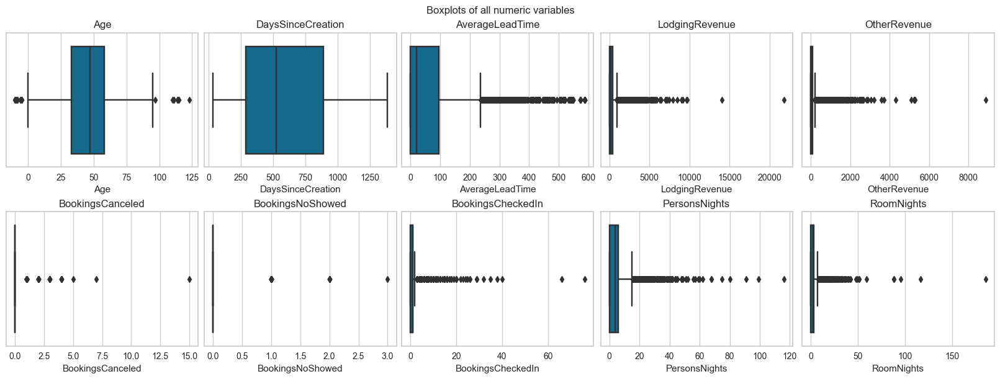

In [24]:
rows = 2
cols = 5
fig, axes = plt.subplots(rows, cols, figsize=(16, 6), constrained_layout=True)
for ax, var in zip(axes.flatten(), numeric_vars):
    sns.boxplot(x=ds_EDA[var], ax=ax, orient='h')
    ax.set_title(var)
fig.suptitle('Boxplots of all numeric variables', fontsize=12)
plt.show()

#Adapted from previous notebook

- [x] `Age` has negative numbers and customers with less than 18 years, due to legal restritions and impossibility to link them to their parents, we are going to exclude them (we can give a range like above 17 because within aprox a year we can contact them and we have the possibility to make some campaigns for Graduation Trips/ Gap Year Trips if the numbers justify that; ``has outliers: Values below 0 and above 100`;
- [ ] `DaysSinceCreation`: no visible outliers
- [x] `AverageLeadTime`: seems excessive we can consider lead times above one year (365 days) as our mx point
- [x] `LodgingRevenue`: Outliers above 2500
- [x] `OtherRevenue`: Outliers above 1000
- [x] `BookingsCanceled`: small occurence, outliers above 7
- [x] `BookingsCheckedIn`: outliers above 50
- [x] `BookingsNoShowed`: small occurence
- [x] `PersonsNights`: outliers above 75
- [x] `RoomNights`: outliers above 75
will be adressed during the data preparation phase.

<a id = "BarPlots"></a>

#### Categorical variables: Bar Plots

[Back to Univariate EDA: Data Visualization](#Univariate-Vizualization)

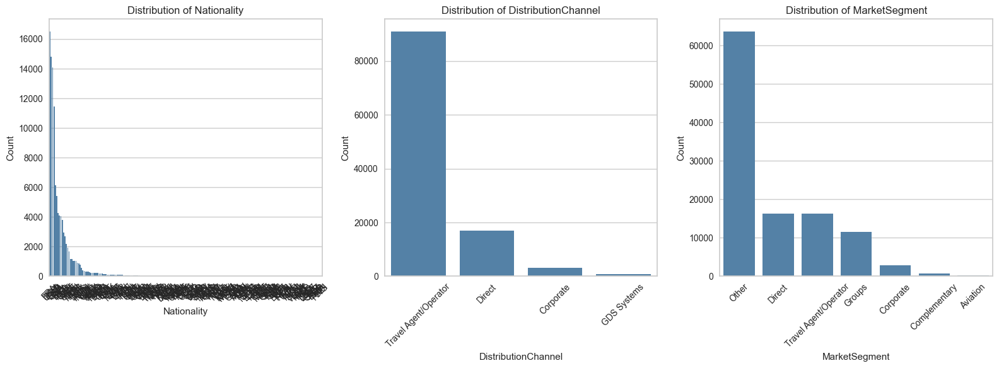

In [25]:
plt.figure(figsize=(16, 6))

# Plot bar charts for each categorical variable
for i, var in enumerate(categorical_vars, 1):
    plt.subplot(1, 3, i)
    sns.countplot(data=ds_EDA, x=var, order=ds_EDA[var].value_counts().index, color='#4682B4')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.title(f'Distribution of {var}')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


#Adapted from Chat GPT

Travel/Operator is the strongest distribution channel. When we look to Market Segment this category is not so prominent and the majority of the customers are from the 'Other' segment and we dont have any explanation about the business aplication of this segment.

<a id = "GeographicMap"></a>

#### Categorical variables: Geographic Map

[Back to Univariate EDA: Data Visualization](#Univariate-Vizualization)

Its difficult to vizualize the Nationality, a Geographic Map can be a easier and intuitive way to understandand the nationality distribution. - Using the ISO Code Alpha 3 we can do that.

In [26]:
# Aggregate the count of visitors by nationality
nationality_counts = ds_EDA['Nationality'].value_counts().reset_index()
nationality_counts.columns = ['Country', 'VisitorCount']

In [27]:
nationality_counts.sort_values(by='VisitorCount', ascending=False).head(10)

,Country,VisitorCount
0,FRA,16516
1,DEU,14805
2,PRT,14101
3,GBR,11462
4,ESP,6123
5,USA,5409
6,ITA,4268
7,BEL,4111
8,BRA,4037
9,NLD,3794


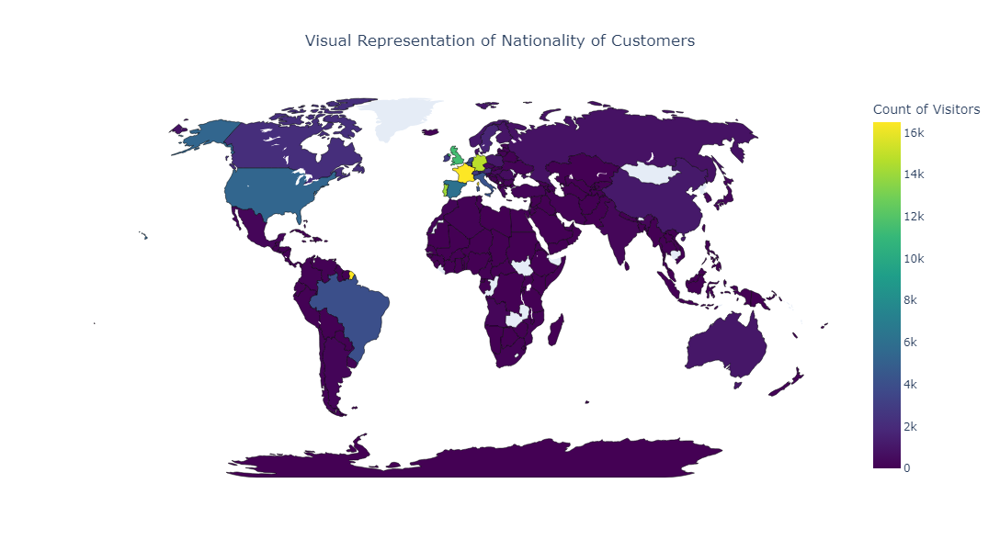

In [28]:
fig = go.Figure(data=go.Choropleth(
    locations=nationality_counts['Country'],
    z=nationality_counts['VisitorCount'],
    text=nationality_counts['Country'],
    colorscale='viridis',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='black',
    marker_line_width=0.5,
    colorbar_tickprefix='',
    colorbar_title='Count of Visitors'
))

fig.update_layout(
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='natural earth'
    ),
    width=1000,  
    height=600,
    title='Visual Representation of Nationality of Customers',
    title_x=0.5,
)

fig.show()

#Adapted from a previous notebook and learned from https://www.youtube.com/watch?v=_FQMD-TpBpM

a lot of clients from `France`; `Germany` (DEU); `Portugal` (National customers); and `Great Britain`. We can have this biggest categories in mind when we reduce the cardinality of this variable.

In [29]:
age_groups = pd.cut(ds_EDA['Age'], bins=[18, 25, 35, 45, 55, 65, 100])

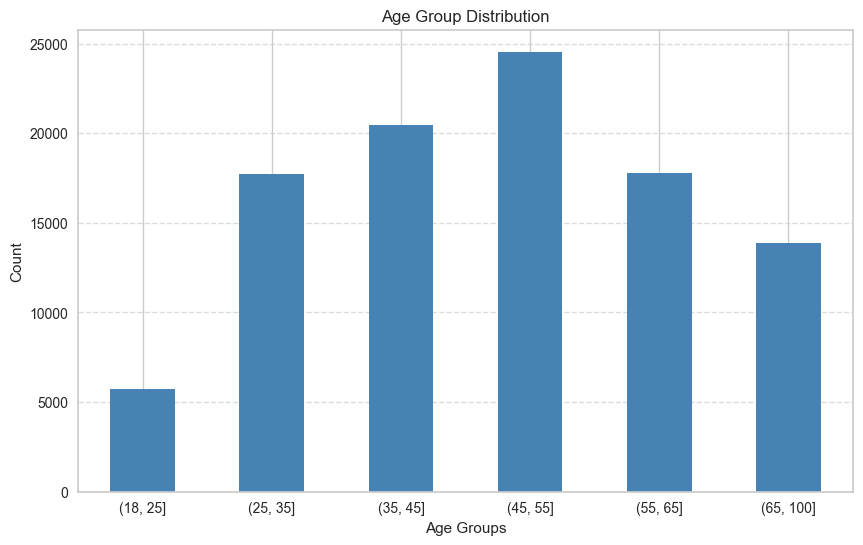

In [30]:
age_counts = age_groups.value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
age_counts.plot(kind='bar', color='steelblue')
plt.title('Age Group Distribution')
plt.xlabel('Age Groups')
plt.ylabel('Count')
plt.xticks(rotation=0)  
plt.grid(axis='y', linestyle='--', alpha=0.7)  
plt.show()

<a id = "Boolean"></a>

#### Boolean variables

[Back to Univariate EDA: Data Visualization](#Univariate-Vizualization)

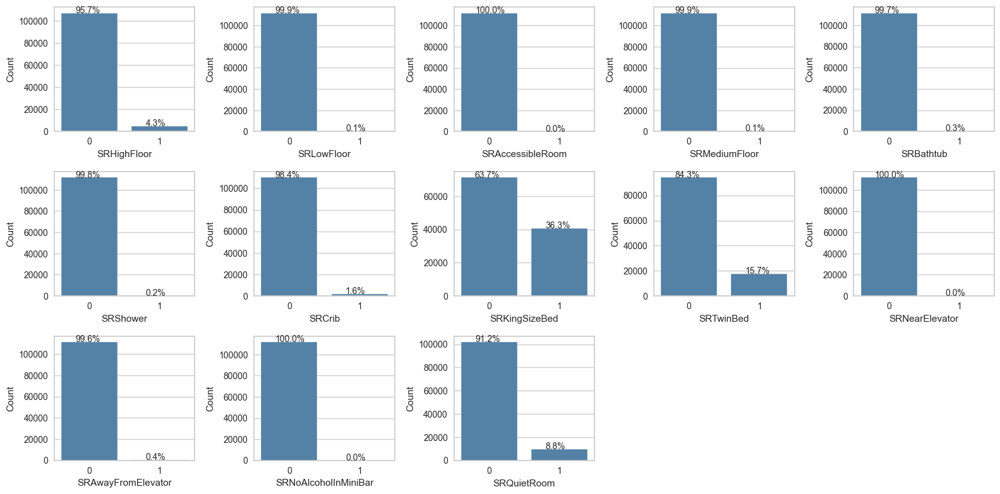

In [31]:
sns.set_style("whitegrid")
plt.figure(figsize=(16, 8))
for i, var in enumerate(boolean_vars, 1):
    plt.subplot(3, 5, i)
    sns.countplot(data=ds_EDA, x=var, color='#4682B4') 
    plt.xlabel(var)
    plt.ylabel('Count')
    
    # Adding percentages to make it easier to read
    total = len(ds_EDA[var])
    for p in plt.gca().patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.20
        y = p.get_y() + p.get_height()
        plt.gca().annotate(percentage, (x, y), size=10)

plt.tight_layout()
plt.show()

#Adapted from Chat GPT

- In terms of floor, clients tend to only specify when they want the top floor.
- Small % for bathtub or shower preferences.
- The difference of preferences start to show in the Bed choice, its normal since a lot of platforms ask for this information to assign the bedrom (Booking does this a lot - if you are a couple or alone you dont want two separate beds). 1.6% have ask for a Crib indicating people staying with babies. 
- We can also see that a QuietRoom is a important request for 8.8% of the customers. 

<a id = "Bivariate-Vizualization"></a>

### 1.2.5. Bivariate EDA: Data Visualization

- [Numeric-Numeric: Correlations](#NNCorrelations)
- [Numeric-Categorical: Correlations](#NCCorrelations)
- [Categorical-Categorical: Cross-tabulations](#CCCross-tabulations)

[Back to Index](#Index)

<a id = "NNCorrelations"></a>

#### Numeric-Numeric: Correlations

[Back to Bivariate EDA: Data Visualization](#Bivariate-Vizualization)

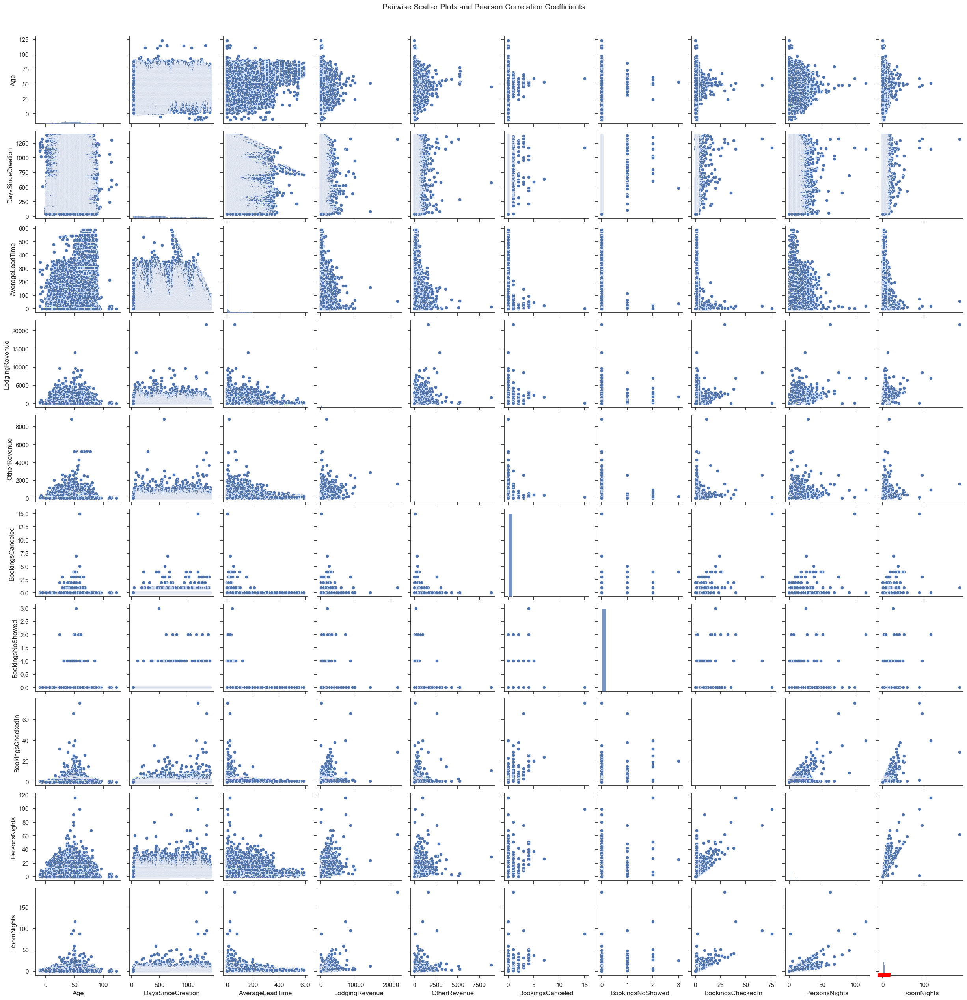

In [32]:
#Doing a Pairwise Scatter Plots and Pearson Correlation Coefficients to understand the relationships beteween Numerical variables

corr_matrix = ds_EDA[numeric_vars].corr(method='pearson')

# pair grid with scatter plots and correlation coefficients
sns.set(style="ticks")
sns.pairplot(ds_EDA[numeric_vars], kind='scatter')
plt.suptitle('Pairwise Scatter Plots and Pearson Correlation Coefficients', y=1.02, fontsize=14)

for i, j in zip(*plt.np.tril_indices_from(corr_matrix, k=-1)):
    plt.text(x=j, y=i, s=f"{corr_matrix.iloc[i, j]:.2f}", ha='center', va='center', fontsize=10, color='red')

plt.show()

#Adapted from Chat GPT

The only correlation we can delve deeper on is `PersonNights` and `RoomNights`:
 - Person/nights = number of nights of the booking x sum of adults and children
 - Room/nights = number of rooms of each booking x number of nights of the booking
They have the same multiplicator number of nights of the booking and has the number of persons increases, the number of rooms could increase as well wich leads to the positive correlation.

Since we dont have a lot of linear relationships we are going to use the Spearman Correlation, bc its less sensitive to outliers compared to Pearson correlation. 

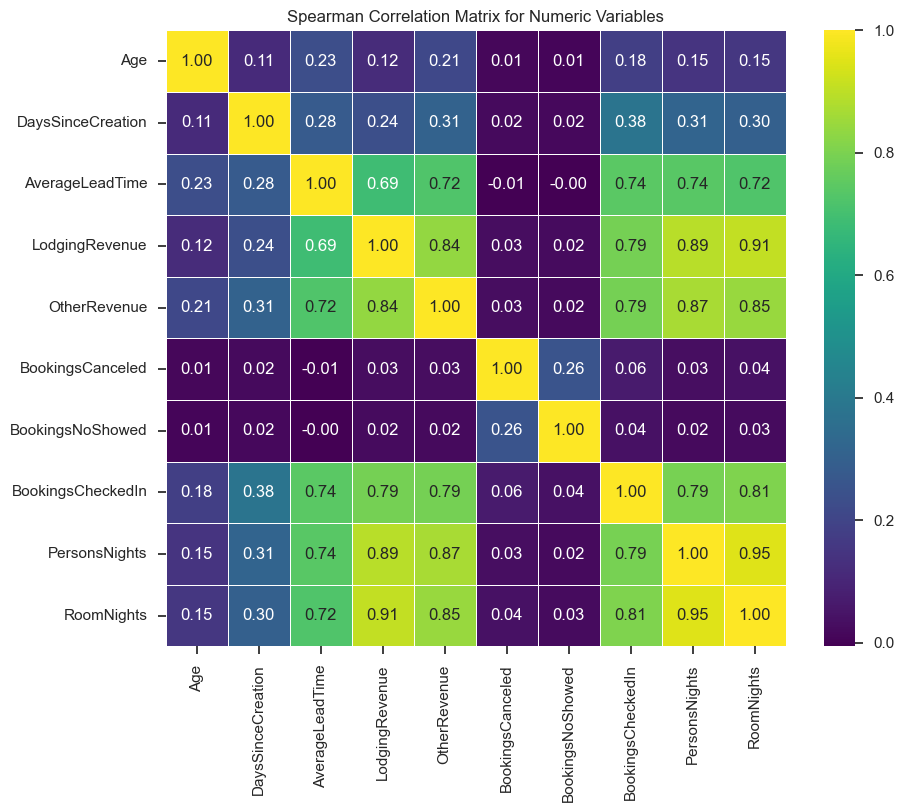

In [33]:
# correlation matrix using Spearman correlation
corr_matrix_spearman = ds_EDA[numeric_vars].corr(method='spearman')
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_spearman, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title('Spearman Correlation Matrix for Numeric Variables')
plt.show()

#Adapted from Previous Notebook

- `PersonNights` and `RoomNights`: Still the The most significant positive correlation 0.95 - one of these can be deleted (maintain PersonNights can be good for understand the big picture in terms of total customers of the hotel since the hotel only creates a profile for the booking holder and in this way we can see if they are with a group or not) 
- `RoomNights` and `LodgingRevenue`: spending more nigths is not free 0.91
- `PersonNights` and `LodgingRevenue`: Same logic 0.89
- `PersonNights` and `OtherRevenue`: More people, more money in extras (food...) 0.87
- `RoomNights` and `OtherRevenue`: Same logic 0.85
- `LodgingRevenue` and `OtherRevenue`: 0.84
- We also have a correlation between `BookingsCheckedIn` and `RoomNights` (0.81) and `BookingsCheckedIn` and `PersonNights` (0.79)
- And `BookingsCheckedIn` and `LodgingRevenue` and `OtherRevenue`, both 0.79

this correlations indicate that we can use the Priciple Component Analysis (PCA) and reduce the number of variables to imorove the performance of the K-means clustering. We also can think about turning `LodgingRevenue` and `OtherRevenue`into one total Revenue variable.

<a id = "NCCorrelations"></a>

#### Numeric-Categorical: Correlations

[Back to Bivariate EDA: Data Visualization](#Bivariate-Vizualization)

In [34]:
ds_EDA['TotalRevenue'] = ds_EDA['LodgingRevenue'] + ds_EDA['OtherRevenue']

In [35]:
ds_EDA['BookingsNotAttended'] = ds_EDA['BookingsNoShowed'] + ds_EDA['BookingsCanceled']

In [36]:
# We are going to reduce the categories of Nationality broadly in this phase just to explore correlations. We will perform this procedure correctly during data preparation.
top_countries = ['FRA', 'DEU', 'PRT', 'GBR', 'ESP', 'USA'] #using the data from before
ds_EDA['NationalityCategory'] = ds_EDA['Nationality'].apply(lambda x: x if x in top_countries else 'Other')

In [37]:
# combinations for analysis
combinations = [
    {'numeric': 'PersonsNights', 'categorical': 'DistributionChannel'}, #Persons by  Distribution Channel
    {'numeric': 'TotalRevenue', 'categorical': 'DistributionChannel'}, #Revenue by Distribution Channel
    {'numeric': 'BookingsCheckedIn', 'categorical': 'DistributionChannel'}, #Check-In by Distribution Channel
    {'numeric': 'BookingsNotAttended', 'categorical': 'DistributionChannel'}, #Bookings not Attended (cancel or not show up) by Distribution Channel
    {'numeric': 'TotalRevenue', 'categorical': 'NationalityCategory'}, #Revenue by Country
    {'numeric': 'PersonsNights', 'categorical': 'NationalityCategory'}, #Persons by Country
    {'numeric': 'BookingsCheckedIn', 'categorical': 'NationalityCategory'}, #Check-In by Country
    {'numeric': 'BookingsNotAttended', 'categorical': 'NationalityCategory'}, #Bookings not Attended (cancel or not show up) by Country
    {'numeric': 'TotalRevenue', 'categorical': 'MarketSegment'}, #Revenue by Market Segment
    {'numeric': 'PersonsNights', 'categorical': 'MarketSegment'}, #Persons (groups) by Market Segment
    {'numeric': 'BookingsCheckedIn', 'categorical': 'MarketSegment'}, #Check.ins by Market Segment
    {'numeric': 'BookingsNotAttended', 'categorical': 'MarketSegment'} #Bookings not Attended (cancel or not show up) by MarketSegment
] #test the previous segment

In [38]:
# Function to generate a graph for each combination of numeric-categorical
def generate_graph(data, numeric_col, categorical_col, ax):
    if data[categorical_col].dtype == 'object':
        data.groupby(categorical_col)[numeric_col].sum().plot(kind='bar', ax=ax)
        ax.set_title(f"{numeric_col} by {categorical_col}")
        ax.set_xlabel(categorical_col)
        ax.set_ylabel(numeric_col)
        ax.tick_params(axis='x', rotation=45)
    else:
        ax.scatter(data[categorical_col], data[numeric_col])
        ax.set_title(f"{numeric_col} by {categorical_col}")
        ax.set_xlabel(categorical_col)
        ax.set_ylabel(numeric_col)
        
#Adapted from Chat GPT request

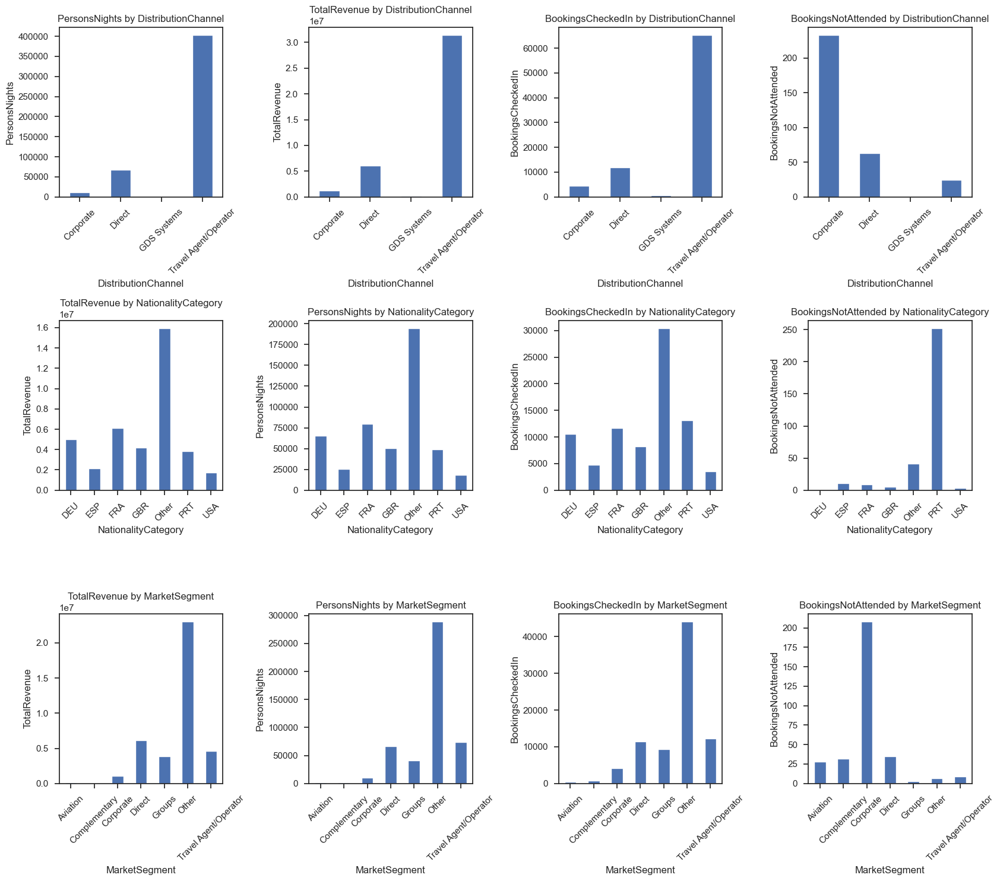

In [39]:
#subplots
num_plots = len(combinations)
num_cols = 4 
num_rows = math.ceil(num_plots / num_cols)
fig, axs = plt.subplots(num_rows, num_cols, figsize=(17,5 * num_rows))

# Generating the graph for each combination
for i, combo in enumerate(combinations):
    row = i // num_cols
    col = i % num_cols
    ax = axs[row, col] if num_rows > 1 else axs[col]
    generate_graph(ds_EDA, combo['numeric'], combo['categorical'], ax)
plt.tight_layout()
plt.show()

In [40]:
#Lets complement with cross tabs to compare the %
for combo in combinations:
    categorical_col = combo['categorical']
    numeric_col = combo['numeric']
    
    cross_table = ds_EDA.groupby(categorical_col, as_index=False)[numeric_col].sum()
    total = cross_table[numeric_col].sum()
    cross_table['Percentage'] = ((cross_table[numeric_col] / total) * 100).round(0).astype(int).astype(str) + '%'
    cross_table = cross_table.sort_values(by=numeric_col, ascending=False)  # Sort by numeric column
    display(cross_table)
    
#Adapted from chat gpt request 

,DistributionChannel,PersonsNights,Percentage
3,Travel Agent/Operator,402795,83%
1,Direct,67884,14%
0,Corporate,11274,2%
2,GDS Systems,1663,0%


,DistributionChannel,TotalRevenue,Percentage
3,Travel Agent/Operator,31406751.12,81%
1,Direct,6070624.77,16%
0,Corporate,1239245.85,3%
2,GDS Systems,226137.18,1%


,DistributionChannel,BookingsCheckedIn,Percentage
3,Travel Agent/Operator,65269,79%
1,Direct,11905,14%
0,Corporate,4546,6%
2,GDS Systems,695,1%


,DistributionChannel,BookingsNotAttended,Percentage
0,Corporate,233,72%
1,Direct,63,20%
3,Travel Agent/Operator,25,8%
2,GDS Systems,1,0%


,NationalityCategory,TotalRevenue,Percentage
4,Other,15923135.04,41%
2,FRA,6109496.90,16%
0,DEU,5028897.65,13%
3,GBR,4168431.94,11%
5,PRT,3859441.86,10%
1,ESP,2119978.14,5%
6,USA,1733377.39,4%


,NationalityCategory,PersonsNights,Percentage
4,Other,194418,40%
2,FRA,79452,16%
0,DEU,65651,14%
3,GBR,50797,11%
5,PRT,48802,10%
1,ESP,25836,5%
6,USA,18660,4%


,NationalityCategory,BookingsCheckedIn,Percentage
4,Other,30407,37%
5,PRT,13188,16%
2,FRA,11651,14%
0,DEU,10572,13%
3,GBR,8246,10%
1,ESP,4787,6%
6,USA,3564,4%


,NationalityCategory,BookingsNotAttended,Percentage
5,PRT,252,78%
4,Other,41,13%
1,ESP,11,3%
2,FRA,9,3%
3,GBR,5,2%
6,USA,3,1%
0,DEU,1,0%


,MarketSegment,TotalRevenue,Percentage
5,Other,23023016.41,59%
3,Direct,6105310.29,16%
6,Travel Agent/Operator,4644151.25,12%
4,Groups,3887811.19,10%
2,Corporate,1082017.43,3%
0,Aviation,176023.60,0%
1,Complementary,24428.75,0%


,MarketSegment,PersonsNights,Percentage
5,Other,288940,60%
6,Travel Agent/Operator,73874,15%
3,Direct,66523,14%
4,Groups,40735,8%
2,Corporate,9949,2%
1,Complementary,2113,0%
0,Aviation,1482,0%


,MarketSegment,BookingsCheckedIn,Percentage
5,Other,44067,53%
6,Travel Agent/Operator,12234,15%
3,Direct,11351,14%
4,Groups,9364,11%
2,Corporate,4228,5%
1,Complementary,750,1%
0,Aviation,421,1%


,MarketSegment,BookingsNotAttended,Percentage
2,Corporate,208,65%
3,Direct,35,11%
1,Complementary,32,10%
0,Aviation,28,9%
6,Travel Agent/Operator,9,3%
5,Other,7,2%
4,Groups,3,1%


`DistributionChannel` by
- `PersonsNights` & `TotalRevenue` &  `BookingsCheckedIn`: Travel Agent/Operator leads this variables and GDS Systems have small to none impact.
- `BookingsNotAttended`: This column combines no-shows and cancellations. `Corporate` bookings exhibit the highest unattended bookings, this can lead to operational challenges. Typically, Corporate bookings involve large groups, resulting in multiple room reservations and bookings for meeting rooms and restaurant tables. This increases the risk of resource underutilization (inefficient utilization of fixed capacity) and revenue loss, especially considering missed opportunities for other clients to utilize these resources (potential extra revenues). Measures like improved communication and revised policies (cancelation costs) can be considered.

`NationalityCategory` by
- `TotalRevenue` & `PersonsNights`: We create this gross categories just to understand the behaviour of the Top 10 Nationalities and the Others. France and Germany (not considering the Others) are the biggest source of revenue and persons as single countries. 
- `BookingsCheckedIn` & `BookingsNotAttended`: It's noteworthy that despite France and Germany having more appearances (indicating a larger variety of clients -COUNT), Portuguese clients account for the highest number of check-ins and unattended bookings - SUM. This suggests that national clients tend to frequent the hotel multiple times, with individual clients making multiple bookings. In light of this observation, implementing loyalty programs and revising policies, such as introducing cancellation fees or offering the option to pay more for flexibility in rescheduling, could be beneficial.

`MarketSegment` by
- `TotalRevenue` & `PersonsNights` & `BookingsCheckedIn`: The distributions is similiar but now its clear that the majority of the customers who bring the biggest source of revenue, most people and check in more times are all in one non specific category ('Other'), and other categories like 'Aviation' and 'Complemntary' are almost non existent wich can mean that this segmentation is outdated and must be adapted to the current landscape of the hotel to optimize the Marketing initiatives. 
- `BookingsNotAttended`: Corporate Segment still appears as the one with the highest unattended rate. Same logic as above.  

In [41]:
# In terms of age we can divided by age groups to see if there´s a group that tends to spend more 

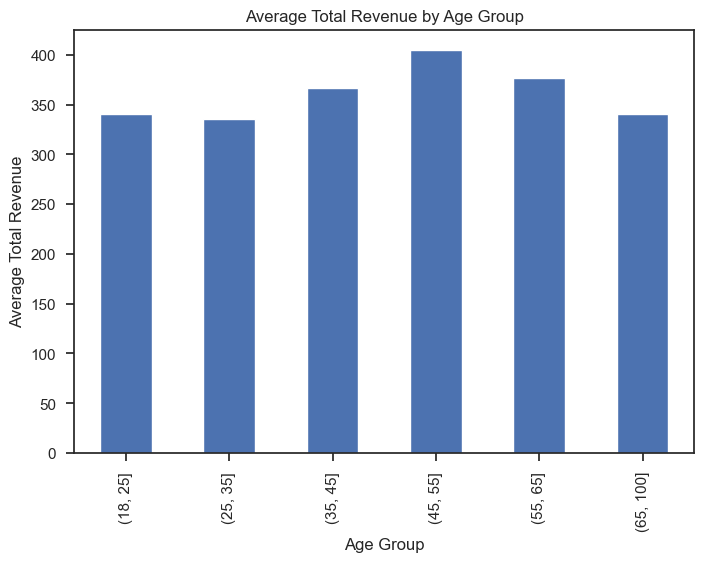

In [42]:
# Revenue per Age Group
revenue_age = ds_EDA.groupby(age_groups)['TotalRevenue'].mean()
revenue_age.plot(kind='bar')
plt.xlabel('Age Group')
plt.ylabel('Average Total Revenue')
plt.title('Average Total Revenue by Age Group')
plt.show()

#Adapted from previous notebook 

As expected, middle-aged clients tend to spend more, which reflects their increased willingness to invest in comfort and convenience. Interestingly, even younger clients (aged 20-30) exhibit a respectable average revenue - we divide 20-30 and 30-40 because the monetary power in the 20's tend to be very different comparing to the 30's and we can be compararing people starting a career and people in well establish positions.

In [43]:
# Number of people that have a record for less than one year but never checked in
num_less_than_one_year = ds_EDA[(ds_EDA['DaysSinceCreation'] <= 365) & (ds_EDA['BookingsCheckedIn'] == 0)].shape[0]

# Number of people that have a record for more than one year and less than 2 but never checked in
num_more_than_one_year = ds_EDA[((ds_EDA['DaysSinceCreation'] > 365) & (ds_EDA['DaysSinceCreation'] <= 730)) & (ds_EDA['BookingsCheckedIn'] == 0)].shape[0]

# Number of people that have a record for more than 2 years but never checked in
num_more_than_two_years = ds_EDA[(ds_EDA['DaysSinceCreation'] > 730) & (ds_EDA['BookingsCheckedIn'] == 0)].shape[0]

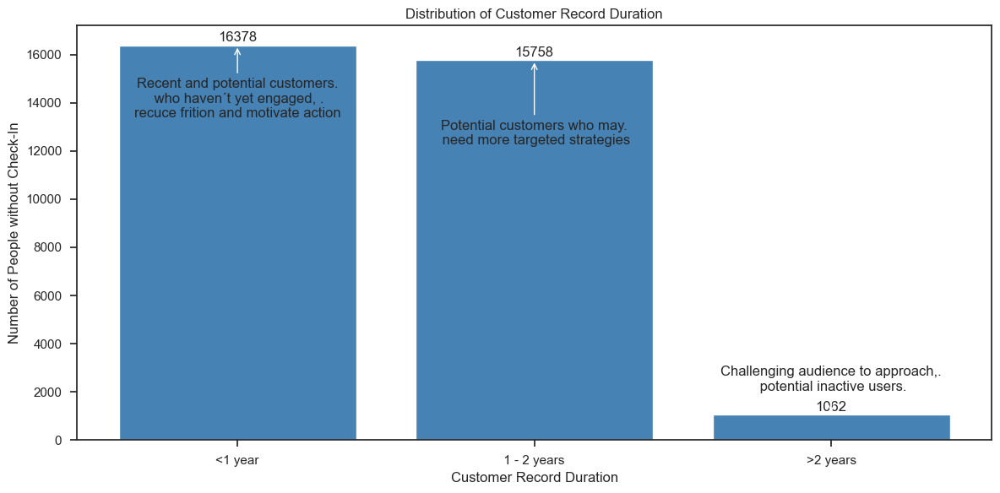

In [44]:
# Define the categories and their corresponding counts
categories = ['<1 year', ' 1 - 2 years ', '>2 years']
counts = [num_less_than_one_year, num_more_than_one_year, num_more_than_two_years]

# Create the bar plot
plt.figure(figsize=(12,6))
bars = plt.bar(categories, counts, color='steelblue')

# Add annotations to each bar
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count + 50, str(count), ha='center', va='bottom')

# Add marketing annotations
plt.annotate('Recent and potential customers.\n who haven´t yet engaged, .\nrecuce frition and motivate action',
             xy=(0, num_less_than_one_year), xytext=(0, num_less_than_one_year - 3000),
             arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=12, ha='center')
plt.annotate('Potential customers who may.\n need more targeted strategies',
             xy=(1, num_more_than_one_year), xytext=(1, num_more_than_one_year - 3500),
             arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=12, ha='center')
plt.annotate('Challenging audience to approach,.\n potential inactive users.',
             xy=(2, num_more_than_two_years), xytext=(2, num_more_than_two_years + 1000),
             arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=12, ha='center')

# Add labels and title
plt.xlabel('Customer Record Duration')
plt.ylabel('Number of People without Check-In')
plt.title('Distribution of Customer Record Duration')

# Show plot
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


### Old Segmentation: Why is it no longer serving us?

In today's increasingly competitive landscape, segments should provide us with more than just information about sales origin; they should also offer insights into who our clients and markets are. This allows us to gain knowledge and align our strategy accordingly. However, even if that information were sufficient, the following section will demonstrate that the old segment is outdated and no longer serves our needs. Firstly, in our previous analysis, we observed that the most commonly used channel is the Travel Agent and Operator. However, the old segment consistently exhibits preponderance in an undifferentiated segment called 'Other'.

<Figure size 800x400 with 0 Axes>

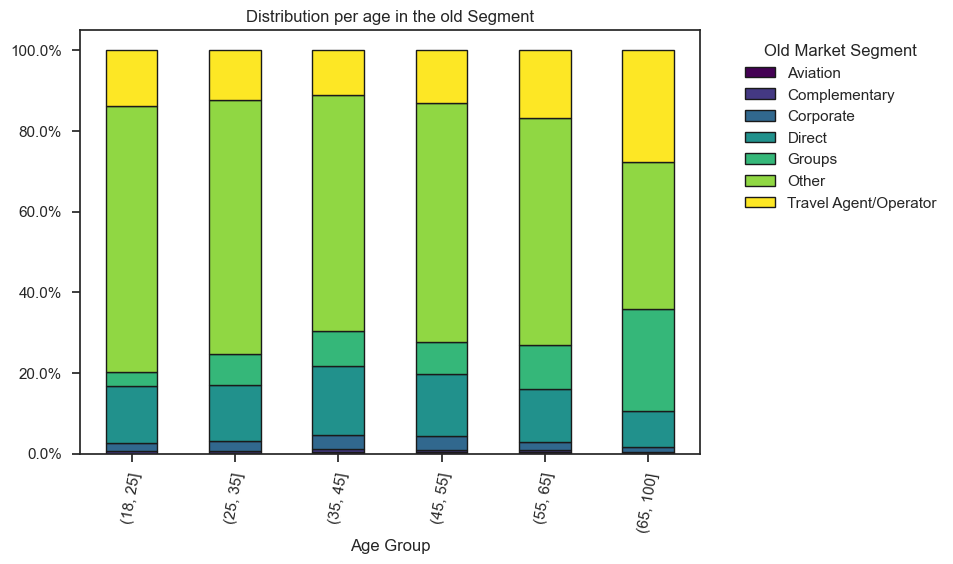

In [45]:
age_vs_segment = ds_EDA.groupby([age_groups, 'MarketSegment']).size().unstack()

# percentages
rating_percentages = age_vs_segment.div(age_vs_segment.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 4))
ax = rating_percentages.plot(kind='bar', stacked=True, edgecolor='k', cmap='viridis')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=1))
plt.title('Distribution per age in the old Segment')
plt.xlabel('Age Group')
plt.xticks(rotation=80)
plt.legend(title='Old Market Segment', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Other segment is always the biggest. Travel Agent/ Operator seems less important in here. Also, Groups leaves it open for interpretation, why is it together with the channels? Lets see:

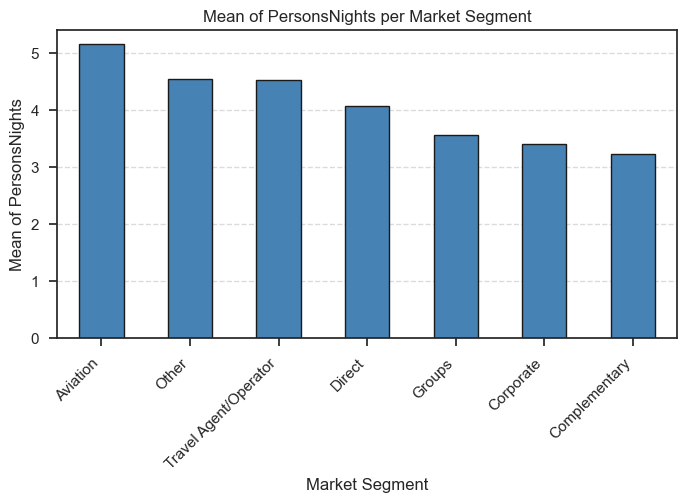

In [46]:
segment_avg_persons = ds_EDA.groupby('MarketSegment')['PersonsNights'].mean().sort_values(ascending=False)

plt.figure(figsize=(8, 4))
segment_avg_persons.plot(kind='bar', color='steelblue', edgecolor='k')

plt.title('Mean of PersonsNights per Market Segment')
plt.xlabel('Market Segment')
plt.ylabel('Mean of PersonsNights')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Groups are not with the biggest average of personsnigths, so it not efficient in this category as well.

<Figure size 800x400 with 0 Axes>

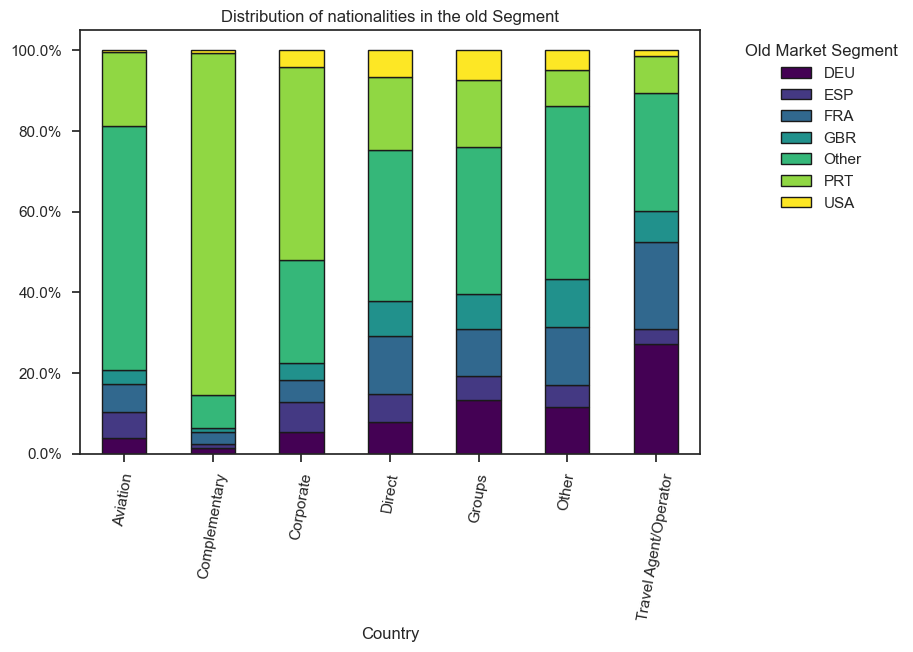

In [47]:
nat_vs_segment = ds_EDA.groupby(['MarketSegment', 'NationalityCategory']).size().unstack()

# percentages
rating_percentages = nat_vs_segment.div(nat_vs_segment.sum(axis=1), axis=0) * 100

plt.figure(figsize=(8, 4))
ax = rating_percentages.plot(kind='bar', stacked=True, edgecolor='k', cmap='viridis')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=1))
plt.title('Distribution of nationalities in the old Segment')
plt.xlabel('Country')
plt.xticks(rotation=80)
plt.legend(title='Old Market Segment', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Portugal Very well represented in the Complemetary segment. Whats does this mean?

- "Complimentary services or products are those given to an audience / a customer without charge. This term is often used in the tourism and hospitality industry. Examples: Complimentary bottle of water in your room, free Wifi, complimentary room service, an upgrade to a higher room category without additional costs." https://www.xotels.com/en/glossary/complimentary
- This segment is very small but means that the national guest might be having more (free according do the definition) complementary actions - maybe influencers or important guests.

Corporate has a lot of Portuguese People as well - relation explain above in bivariate.

<a id = "CCCross-tabulations"></a>

#### Categorical-Categorical: Cross-tabulations

[Back to Bivariate EDA: Data Visualization](#Bivariate-Vizualization)


In [48]:
categorical_vars2 = ['NationalityCategory', 'DistributionChannel', 'MarketSegment'] #Changing Nationality to NationalityCategory

In [49]:
# Categorical-Categorical Analysis with Chi-square
for i in range(len(categorical_vars2)):
    for j in range(i+1, len(categorical_vars2)):
        cat_var = categorical_vars2[i]
        cat_var2 = categorical_vars2[j]
        contingency_table = pd.crosstab(ds_EDA[cat_var], ds_EDA[cat_var2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        display(contingency_table)
        print(f"Chi-square Test of Independence for {cat_var} and {cat_var2}: p-value = {p}")
        
#Adapted from previous notebook

DistributionChannel,Corporate,Direct,GDS Systems,Travel Agent/Operator
NationalityCategory,,,,
DEU,113,1319,77,13296
ESP,236,1135,125,4627
FRA,151,2329,41,13995
GBR,108,1470,142,9742
Other,955,6125,194,36043
PRT,1422,3402,53,9224
USA,150,1103,64,4092


Chi-square Test of Independence for NationalityCategory and DistributionChannel: p-value = 0.0


MarketSegment,Aviation,Complementary,Corporate,Direct,Groups,Other,Travel Agent/Operator
NationalityCategory,,,,,,,
DEU,11,9,159,1298,1521,7376,4431
ESP,19,6,216,1135,677,3446,624
FRA,20,20,160,2331,1341,9128,3516
GBR,10,6,122,1444,1005,7595,1280
Other,174,54,752,6124,4159,27278,4776
PRT,53,557,1402,2932,1923,5735,1499
USA,1,5,120,1099,835,3122,227


Chi-square Test of Independence for NationalityCategory and MarketSegment: p-value = 0.0


MarketSegment,Aviation,Complementary,Corporate,Direct,Groups,Other,Travel Agent/Operator
DistributionChannel,,,,,,,
Corporate,281,19,2204,13,482,37,99
Direct,0,510,51,15970,171,151,30
GDS Systems,0,0,2,7,5,677,5
Travel Agent/Operator,7,128,674,373,10803,62815,16219


Chi-square Test of Independence for DistributionChannel and MarketSegment: p-value = 0.0


- More portugueses from Corporate channel (National companies)
- The Travel Agent/Operator in DistributionChannel appears to correspond to the segement Other in MarketSegment, this is a bit misleading since the MarketSegment also has a Travel Agent/Operator segment.


----------------------------------------------------------------------------------------------------------------

`Boolean-Boolean Analysis`: We analyze this type of correlations to see if, for example, people that specify a crib also specify a Bathtub to be easy to give a bath to the baby or if the people who want a quiet room also want them way from the elevator, but since we have a lot of 0 (no) values its difficult to extrat conclusions  

boolean_vars2 = ['SRHighFloor', 'SRBathtub', 'SRCrib', 'SRKingSizeBed', 'SRTwinBed', 
                'SRNearElevator', 'SRAwayFromElevator', 'SRQuietRoom']
threshold = 0.05
for i in range(len(boolean_vars2)):
    for j in range(i+1, len(boolean_vars2)):
        bool_var = boolean_vars2[i]
        bool_var2 = boolean_vars2[j]
        contingency_table = pd.crosstab(ds_EDA[bool_var], ds_EDA[bool_var2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        
        if p < threshold:
            display(contingency_table)
            print(f"Chi-square Test of Independence for {bool_var} and {bool_var2}: p-value = {p}")

------------------------------------------------------------------------------------------------------------------


<a id = "Multivariate"></a>

### 1.2.6. Multvariate EDA: Duplicates

[Back to Index](#Index)

In [50]:
# Count duplicates
n_duplicates = ds_EDA.duplicated().sum()
n_duplicates

111

So we need to treat this total duplicates, we also want to combine NameHash, DocIDHash and Nationality and combine the rows (for example sum revenue) to eliminate the duplicate guests (parcial duplicates).

### <div class="alert-info">Data Preparation Steps</div>
- **variable types are corrrect as we said before**
- **Removing Duplicates and agg using (`Nationality`, `NameHash`, `DocIDHash`)**
- **Removing Guests with Age < 18: (legally we cant approach them and we cant map then to the parents) and Age > 100**
- **Removing Records with `DaysSinceCreation` and `AverageLeadTime`< 0**
- **When ['BookingsCanceled'] == 0) & ['BookingsNoShowed'] == 0) & (df['BookingsCheckedIn'] == 0) the customer never stayed or booked the hotel so it can be Adjustments or Refunds. If this still exists after the duplicates treatment then we can NOT map the customer and should be removed.**
- **When ['LodgingRevenue'] < 0) | (df['OtherRevenue'] < 0)] Adjustments or Refunds it can be Adjustments or Refunds. If this still exists after the duplicates treatment then we can NOT map the customer and should be removed.**
- **Remove records where (['PersonsNights'] < 0) | (['RoomNights'] < 0).**
- **Remove 'BookingsCheckedIn'] > 0) & ((['RoomNights'] == 0) | (['PersonsNights'] == 0))]**
- **Normalize variables (cardinality...)**
- **Treating Missing Values and Outliers.**
- **Feature Engineering: create new skus**
- **Variable pre-selection**
- **Encoding**
- **Principal Component analysis**

<a id = "Data-Preparation"></a>
    
## 2. Data Preparation
 
 - [Duplicates](#Duplicates)
    
 - [Inconsistent data](#Inconsistent-data)
     
 - [Outliers](#Outliers)
     
 - [Feature Engineering](#Features)
     
 - [Variable pre-selection](#Variable-selection)
     
 - [Encoding](#Encoding)
 
 - [Normalization](#Normalization)
     
 - [Missing values](#Missing-values)
     
 - [Principal Component Analysis](#PCA)
 

[Back to Index](#Index)


In [51]:
ds1.shape

(111733, 28)

<a id = "Duplicates"></a>

### Duplicates

[Back to Data Preparation](#Data-Preparation)

Using (`Nationality`, `NameHash`, `DocIDHash`), we also aknowledge that some companies ask the employes to put the company Identification and some of them uses their own name, mas still, are different persons (same DocID Hash different name) so we use this combination

In [52]:
#The following code is a combination of previous Notebooks, ChatGPT and simple code comnined and adapted for this specific case 

In [53]:
ds1.drop_duplicates(inplace = True) #we dont want to agg completly repeated records

In [54]:
ds1.shape

(111622, 28)

In [55]:
ds1['DocIDHash'].value_counts() #We need to set the default DocId to Nan otherwise clients with same name and nationality will be the same

DocIDHash
0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855    3021
0xA486FBACF4B4E5537B026743E3FDFE571D716839E758236F42950A61FE6B922B      31
0x2B17E9D2CCEF2EA0FE752EE345BEDFB06741FFC8ECECF45D6BBDBAF9A274FF52      24
0x469CF1F9CF8C790FFA5AD3F484F2938CBEFF6435BCFD734F687EC6D1E968F076      15
0x2A14D03A4827C67E0D39408F103DB417AD496DCE6158F8309E6281185C042003      14
                                                                      ... 
0x5825AA46E4884EF879A26E514C9D0E91AAE46494F128B0AD44D81AD639DD5A26       1
0x68C8B2108F69FF2A322604377D0DE06789F07832D156036729C355779937BEF2       1
0x5374A726D76E12468AE43D19578A8E3B298D7F73FDF68AAD3831B003EECBBFC4       1
0xD607359B06F530FC11E7A23618EEC6299286E3925A8699806683DFDFF0B3D7A4       1
0xD539E89183AB389864B7A24B3C1FBC1FE20A40ED02E7CE438BCBA07BB1012304       1
Name: count, Length: 103480, dtype: int64

In [56]:
ds1.loc[(ds1['DocIDHash'] == '0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B934CA495991B7852B855'), 'DocIDHash'] = np.nan 

Without the DocIDHash we can not identify a individual person properly, two person from Portugal can be called Catarina and by combining duplicates this will agg the revenue of 2 persons (or more) in one and is not consistent. To reach the desire integrity of data we will drop all columns with DosIDHas == Nan

<Axes: >

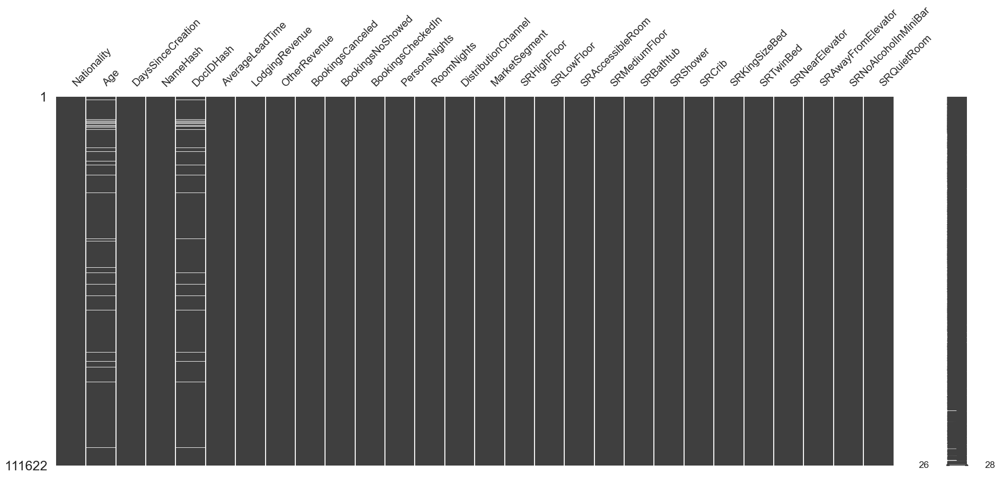

In [57]:
msno.matrix(ds1)

Now that we've turned the default Id into a NaN value, we can use the missingno matrix to visualize the missing data, and we can clearly see that the missing age records are consistent with the DocIdHash missing records. This suggests that the problems with data quality, particularly regarding missing data, demand more consistent rules and standard procedures when guests arrive for check-in, especially concerning mandatory ID identification. On the other hand, this may also indicate that we don't have access to clients' personal information until they arrive to check in (as the agency doesn't provide it to us, so we cannot approach the client directly, potentially to maintain the commission rate). 

In [58]:
ds1 = ds1.dropna(subset=['DocIDHash']) #At this point we have 310 missing Age records, the majority of the Age missing data was coincident with the default docidhash and missinh docidhash - the hotel dont have access to the customer info 

In [59]:
ds1[ds1.duplicated(subset=['NameHash', 'DocIDHash', 'Nationality'], keep=False)].sort_values(by=['DocIDHash']).shape

(5080, 28)

As we said before we are going to assume that a combination of ['NameHash', 'DocIDHash', 'Nationality'] must be the same person:

In [60]:
ds1[ds1.duplicated(subset=['NameHash', 'DocIDHash', 'Nationality'], keep=False)].sort_values(by=['DocIDHash']).head()

,Nationality,Age,DaysSinceCreation,NameHash,DocIDHash,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
61172,FRA,60.0,480,0x0D54EA6B14A0574CAA2D3802565441048C5C831EB035...,0x00006E606D590F336C289D2CC995A0C726878BCAC001...,127,318.0,148.00,0,0,1,4,2,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,1
61251,FRA,60.0,479,0x0D54EA6B14A0574CAA2D3802565441048C5C831EB035...,0x00006E606D590F336C289D2CC995A0C726878BCAC001...,1,177.0,14.00,0,0,1,2,1,Direct,Direct,0,0,0,0,0,0,0,1,0,0,0,0,1
44337,IND,38.0,630,0x9C078C3BE9FDC59F25E736E57DAFBCCDE64197FC560D...,0x000443891856CB5D74287EDBFBE82A4F6D2841F2D1DB...,80,498.0,157.47,0,0,1,4,2,Travel Agent/Operator,Groups,0,0,0,0,0,0,0,0,1,0,0,0,0
44435,IND,38.0,629,0x9C078C3BE9FDC59F25E736E57DAFBCCDE64197FC560D...,0x000443891856CB5D74287EDBFBE82A4F6D2841F2D1DB...,0,249.0,38.00,0,0,1,2,1,Direct,Direct,0,0,0,0,0,0,0,0,1,0,0,0,0
63776,GBR,49.0,460,0x591E70AF9A305B5592F30EC4645878DE67AB1C6755B9...,0x001478086F84325B65735E7A4980BCD9CC8A2C609EE9...,305,216.0,320.00,0,0,1,4,2,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,1


Lets see for example, ID 61172 and 61251, same name, same doc id, same nationality and the age shows that this indeed is the same person, one record is 480 days old from a reservation made by Travel Agent/Operator and one day later is created a new record using the Direct channel, maybe the person wanted to add more rooms to the reservation and contacted the Hotel directly, upon that the hotel created a new record maybe due to the fact that this automatically relays on a new segment (Direct). Same for the second person.

Third person seems like an adjust to add a kin size bed and so on...

We need to agg this records em terms for example of LodgingRevenue, OtherRevenue, BookingsCanceled, BookingsNoShowed, BookingsCheckedIn, PersonsNights, RoomNights. DistributionChannel cant me agg but we can mantain the most recent one. in Special requests if one is 0 and other is 1 them the single record becomes 1.....

In [61]:
ds1['index'] = ds1.index
agg_functions = {
    'index': 'first',
    'Age': 'last',  # Keep the last age (most recent)
    'DaysSinceCreation': 'first',  # Keep the first DaysSinceCreation (original longevity of the client- if by mistake we create a new file for one of our oldest clients we still want to know that)
    'AverageLeadTime': 'first',  # Keep the first AverageLeadTime (in case of alterations, maintain the original lead time - is still a plan with time customer)
    'LodgingRevenue': 'sum',  # Sum of LodgingRevenue
    'OtherRevenue': 'sum',  # Sum of OtherRevenue
    'BookingsCanceled': 'sum',  # Sum of BookingsCanceled
    'BookingsNoShowed': 'sum',  # Sum of BookingsNoShowed
    'BookingsCheckedIn': 'sum',  # Sum of BookingsCheckedIn
    'PersonsNights': 'sum',  # Sum of PersonsNights
    'RoomNights': 'sum',  # Sum of RoomNights
    'DistributionChannel': 'last',  # Keep the last DistributionChannel (most recent)
    'MarketSegment': 'last',  # Sum of MarketSegment
    'SRHighFloor': 'max',  # Maximum value of SRHighFloor
    'SRLowFloor': 'max',  # Maximum value of SRLowFloor
    'SRAccessibleRoom': 'max',  # Maximum value of SRAccessibleRoom
    'SRMediumFloor': 'max',  # Maximum value of SRMediumFloor
    'SRBathtub': 'max',  # Maximum value of SRBathtub
    'SRShower': 'max',  # Maximum value of SRShower
    'SRCrib': 'max',  # Maximum value of SRCrib
    'SRKingSizeBed': 'max',  # Maximum value of SRKingSizeBed
    'SRTwinBed': 'max',  # Maximum value of SRTwinBed
    'SRNearElevator': 'max',  # Maximum value of SRNearElevator
    'SRAwayFromElevator': 'max',  # Maximum value of SRAwayFromElevator
    'SRNoAlcoholInMiniBar': 'max',  # Maximum value of SRNoAlcoholInMiniBar
    'SRQuietRoom': 'max'  # Maximum value of SRQuietRoom
}

In [62]:
df_agg = ds1.groupby(['NameHash', 'DocIDHash', 'Nationality']).agg(agg_functions)

In [63]:
df_agg[df_agg['index'] == 61172] #we keep the ol index to perform this verification

,,,index,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
NameHash,DocIDHash,Nationality,,,,,,,,,,,,,,,,,,,,,,,,,,
0x0D54EA6B14A0574CAA2D3802565441048C5C831EB035F93146B4F36B47C31920,0x00006E606D590F336C289D2CC995A0C726878BCAC001496A96243F0CA824A429,FRA,61172,60.0,480,127,495.0,162.0,0,0,2,6,3,Direct,Direct,0,0,0,0,0,0,0,1,0,0,0,0,1


In [64]:
df_agg.reset_index(inplace=True) #Creating a new index
# Droping the existing 'index' column
df_agg.drop(columns=['index'], inplace=True)

In [65]:
df_agg.head(1)

,NameHash,DocIDHash,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
0,0x000093906C9FA7A54C937EF1848D4AA5F79F104D8365...,0xFBB48E8A898A0973E8FC147D2AC89307B16EE4D6B618...,BRA,51.0,205,41,416.66,271.5,0,0,1,10,5,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0


In [66]:
df_agg.shape

(104802, 28)

In [67]:
print(f"Percentage difference: {(((111733 - 104802) / 111733) * 100)}%")

Percentage difference: 6.20318079707875%


In [68]:
ds_clean = df_agg.copy()

6% is an acepatable loss having in mind the size of the dataset

In [69]:
ds_clean.drop(['NameHash','DocIDHash'], axis = 1, inplace= True)

<a id = "Inconsistent-data"></a>

### 2.2. Inconsistent data

[Back to Data Preparation](#Data-Preparation)

In [70]:
ds_clean[(ds_clean['DaysSinceCreation'] < 0) | (ds_clean['AverageLeadTime'] < 0)].shape

(12, 26)

The previous listed inconsistencies will now be resolved: 

In [71]:
ds_clean.shape

(104802, 26)

In [72]:
# Removing customers with Age < 18 and Age > 100
ds_clean = ds_clean.drop(ds_clean[(ds_clean['Age'] < 18) | (ds_clean['Age'] > 100)].index)

In [73]:
# Removing Records with DaysSinceCreation and AverageLeadTime < 0
ds_clean = ds_clean[(ds_clean['DaysSinceCreation'] >= 0) & (ds_clean['AverageLeadTime'] >= 0)]

Customers who haven't canceled, no-showed, or checked in may indicate various scenarios, such as staff needing to adjust past transactions or customers registering without completing a booking. While these customers might not fit segmentation criteria, recent members of loyalty programs or website registrants could respond well to promotions or incentives and make the first booking. A survey could help understand their intentions better for a targeted marketing approach.

In [74]:
Possible_customers = ds_clean[((ds_clean['BookingsCanceled'] == 0) & (ds_clean['BookingsNoShowed'] == 0) & (ds_clean['BookingsCheckedIn'] == 0))] #we save the info into a df of its own for future analitic efforts
Possible_customers

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
3,AUT,57.0,435,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,1
8,NLD,50.0,156,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,1,0,0,0,0
18,IRL,40.0,521,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
19,CAN,47.0,455,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
29,POL,39.0,531,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104787,DEU,59.0,513,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
104788,PRT,25.0,447,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,0
104789,GRC,38.0,262,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
104790,AUT,57.0,507,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,0


In [75]:
# Removing Records where BookingsCanceled, BookingsNoShowed, and BookingsCheckedIn are all 0 - they are not active clients
ds_clean = ds_clean[~((ds_clean['BookingsCanceled'] == 0) & (ds_clean['BookingsNoShowed'] == 0) & (ds_clean['BookingsCheckedIn'] == 0))]

In [76]:
# Removing Records where LodgingRevenue or OtherRevenue < 0
ds_clean = ds_clean[~((ds_clean['LodgingRevenue'] < 0) | (ds_clean['OtherRevenue'] < 0))]

In [77]:
# Removing records where PersonsNights or RoomNights < 0
ds_clean = ds_clean[~((ds_clean['PersonsNights'] < 0) | (ds_clean['RoomNights'] < 0))]

In [78]:
# Removing records where BookingsCheckedIn > 0 and RoomNights or PersonsNights == 0
ds_clean = ds_clean[~((ds_clean['BookingsCheckedIn'] > 0) & ((ds_clean['RoomNights'] == 0) | (ds_clean['PersonsNights'] == 0)))]

In [79]:
ds_clean.shape

(72383, 26)

 <a id = "Outliers"></a>

### Outliers

[Back to Data Preparation](#Data-Preparation)

We are going to `Remove from the modeling data` - When outliers distort the models, algorithms such as K-means clustering or Principal component analysis can be affected. We just need to consider how musch we are going to remove. https://medium.com/@ayeshasidhikha188/unveiling-outliers-exploring-z-score-and-iqr-methods-for-boxplots-67b0f3086720
Code Inspiration (Adaspted and also transformed with chat GPT): https://stackoverflow.com/questions/50461349/how-to-remove-outlier-from-dataframe-using-iqr


In [80]:
ds_clean_IQR = ds_clean.copy()
ds_clean_Zscore = ds_clean.copy()
ds_clean_manual = ds_clean.copy()

In [81]:
def IQR_method(data, numeric_vars):
    """
    Uses the Interquartile Range (IQR) method top remove outliers

    """
    Q25 = data[numeric_vars].quantile(.25)
    Q75 = data[numeric_vars].quantile(.75)
    IRQ = (Q75 - Q25)
    
    upper_l = Q75 + 1.5 * IRQ
    lower_l = Q25 - 1.5 * IRQ
    
    filter = []
    for feature in numeric_vars:
        llim = lower_l[feature]
        ulim = upper_l[feature]
        filter.append(data[feature].between(llim, ulim, inclusive='both'))
    filter = pd.Series(np.all(filter, 0), index=data.index)

    data_filtered = data[filter]

    return data_filtered, filter

In [82]:
def zscore_method(data, metric_features, threshold=3):
    """
    Uses the Z-Score method 

    """
    z_scores = zscore(data[numeric_vars], nan_policy='omit')
    z_scores = np.nan_to_num(z_scores, nan=0)
    filter = (np.abs(z_scores) < threshold).all(axis=1)
    data_filtered = data[filter]
    
    return data_filtered, filter

In [83]:
# Testing the IQR method
df_iqr, filter_iqr = IQR_method(ds_clean_IQR, numeric_vars)
iqr_data_loss = (1 - df_iqr.shape[0] / ds_clean.shape[0]) * 100

# Testing the Z-score method
df_zscore, filter_zscore = zscore_method(ds_clean_Zscore, numeric_vars)
zscore_data_loss = (1 - df_zscore.shape[0] / ds_clean.shape[0]) * 100

In [84]:
print('Data loss percentage after removing outliers using IQR method:', np.round(iqr_data_loss, 4))
print('Data loss percentage after removing outliers using Z-score method:', np.round(zscore_data_loss, 4))

Data loss percentage after removing outliers using IQR method: 17.3825
Data loss percentage after removing outliers using Z-score method: 5.2499


We loose a lot with the IQR method, lets compare with the percentage we would loose with the insights from the data understanding:

- [ ] `Age`: has outliers: Values below 0 and above 100; we already remove these
- [ ] `DaysSinceCreation`: no visible outliers
- [x] `AverageLeadTime`: seems excessive we can consider lead times above one year (365 days) as our mx point
- [x] `LodgingRevenue`: Outliers above 2500
- [x] `OtherRevenue`: Outliers above 1000
- [x] `BookingsCanceled`: small occurence, outliers above 7
- [x] `BookingsCheckedIn`: outliers above 50
- [x] `BookingsNoShowed`: small occurence
- [x] `PersonsNights`: outliers above 60
- [x] `RoomNights`: outliers above 60

In [85]:
# Define outlier removal criteria
outlier_criteria = {
    'AverageLeadTime': 365,
    'LodgingRevenue': 2500,
    'OtherRevenue': 1000,
    'BookingsCanceled': 7,
    'BookingsCheckedIn': 50,
    'PersonsNights': 60,
    'RoomNights': 60
}

In [86]:
# Apply outlier removal criteria
for feature, threshold in outlier_criteria.items():
    if threshold is not None:
        ds_clean_manual = ds_clean_manual[ds_clean_manual[feature] <= threshold]

# Check lost data
percentage_lost_data = ((len(ds_clean) - len(ds_clean_manual)) / len(ds_clean)) * 100
print("Dataset shape after outlier removal:", ds_clean_manual.shape)
print("Percentage of lost data:", percentage_lost_data)

Dataset shape after outlier removal: (70869, 26)
Percentage of lost data: 2.0916513545998368


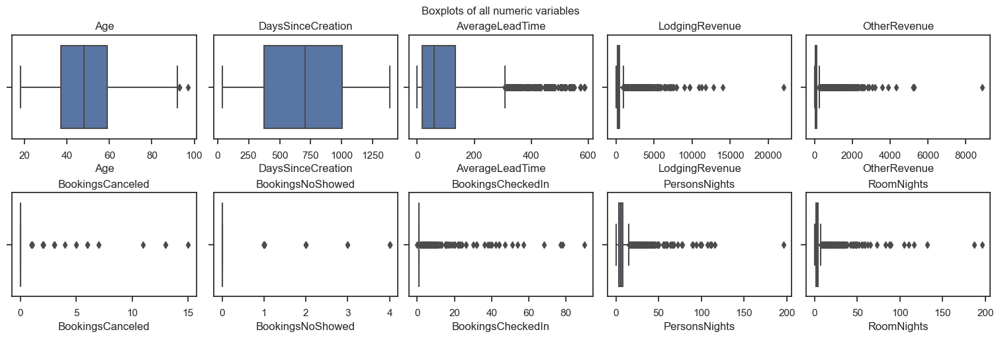

In [87]:
# ds_clean_IQR
rows = 2
cols = 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 5), constrained_layout=True)
for ax, var in zip(axes.flatten(), numeric_vars):
    sns.boxplot(x=ds_clean_IQR[var], ax=ax, orient='h')
    ax.set_title(var)
fig.suptitle('Boxplots of all numeric variables', fontsize=12)
plt.show()

#Adapted from previous notebook

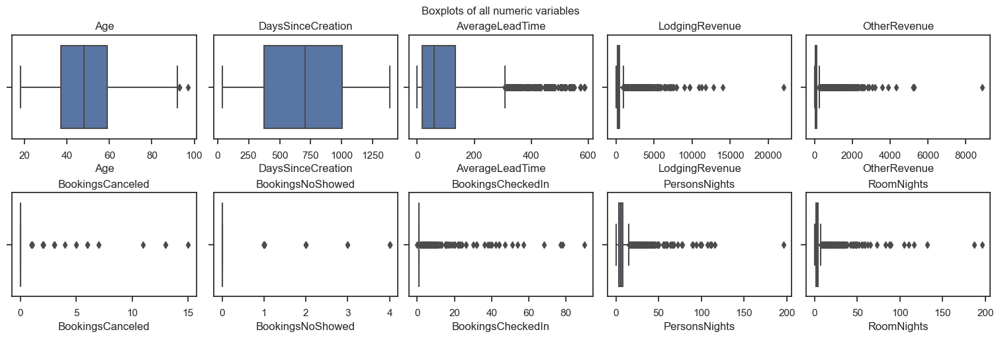

In [88]:
# ds_clean_Zscore
rows = 2
cols = 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 5), constrained_layout=True)
for ax, var in zip(axes.flatten(), numeric_vars):
    sns.boxplot(x=ds_clean_Zscore[var], ax=ax, orient='h')
    ax.set_title(var)
fig.suptitle('Boxplots of all numeric variables', fontsize=12)
plt.show()

#Adapted from previous notebook

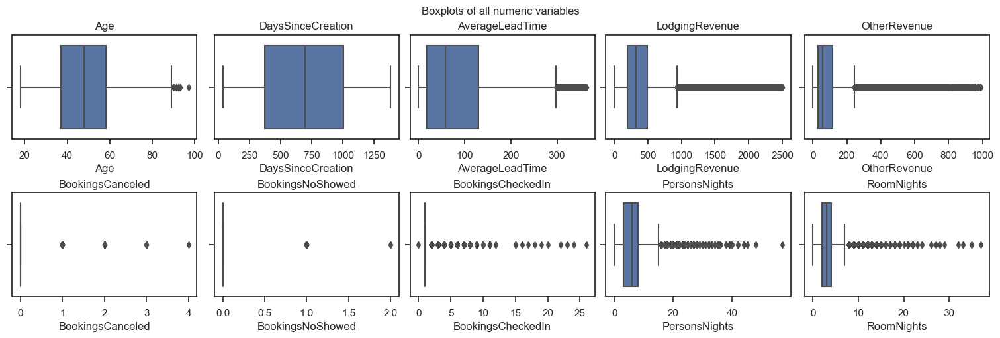

In [89]:
rows = 2
cols = 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 5), constrained_layout=True)
for ax, var in zip(axes.flatten(), numeric_vars):
    sns.boxplot(x=ds_clean_manual[var], ax=ax, orient='h')
    ax.set_title(var)
fig.suptitle('Boxplots of all numeric variables', fontsize=12)
plt.show()

#Adapted from previous notebook

#### <div class="alert-success">We are going to stay with the manual tretament and change if necessary for the algorithm. </div>

In [90]:
ds_Out_clean = ds_clean_manual.copy()

 <a id = "Features"></a>

### Feature Engineering

[Back to Data Preparation](#Data-Preparation)

For this part we've read some articles about  important kpis in hotel industry and althought we cant satisfy the majority of them with the current data we are going to add some that can reduce the number of columns and others that gives us a more intuitive way of analyzing for the data.

We also are going to do this in this phase because we know we only have missing values in the Age column and we need to perform the normalization before the tretment of missing values to use the method we choose.

In [91]:
total_bookings = ds_Out_clean['BookingsCheckedIn'] + ds_Out_clean['BookingsCanceled'] + ds_Out_clean['BookingsNoShowed']

ds_Out_clean['BookingSuccessRate'] = (ds_Out_clean['BookingsCheckedIn'] / total_bookings)

total_special_requests = ds_Out_clean['SRHighFloor'] + ds_Out_clean['SRLowFloor'] + ds_Out_clean['SRAccessibleRoom'] + \
                         ds_Out_clean['SRMediumFloor'] + ds_Out_clean['SRBathtub'] + ds_Out_clean['SRShower'] + \
                         ds_Out_clean['SRCrib'] + ds_Out_clean['SRKingSizeBed'] + ds_Out_clean['SRTwinBed'] + \
                         ds_Out_clean['SRNearElevator'] + ds_Out_clean['SRAwayFromElevator'] + \
                         ds_Out_clean['SRNoAlcoholInMiniBar'] + ds_Out_clean['SRQuietRoom']
ds_Out_clean['TotalSpecialRequests'] = total_special_requests

ds_Out_clean['TotalRevenue'] = ds_Out_clean['LodgingRevenue'] + ds_Out_clean['OtherRevenue']

ds_Out_clean['RevenuePerPersonNight'] = ds_Out_clean['TotalRevenue'] / ds_Out_clean['PersonsNights']

ds_Out_clean['SpendingPerBooking'] = ds_Out_clean['TotalRevenue'] / total_bookings

bookings_not_attended = ds_Out_clean['BookingsCanceled'] + ds_Out_clean['BookingsNoShowed']
ds_Out_clean['BookingsNotAttended'] = bookings_not_attended


# otherrevenue/lodging por quanto de lod eles gastam em others

In [92]:
ds_Out_clean.isna().sum() #Cheeck missing values alteration

Nationality                0
Age                      243
DaysSinceCreation          0
AverageLeadTime            0
LodgingRevenue             0
OtherRevenue               0
BookingsCanceled           0
BookingsNoShowed           0
BookingsCheckedIn          0
PersonsNights              0
RoomNights                 0
DistributionChannel        0
MarketSegment              0
SRHighFloor                0
SRLowFloor                 0
SRAccessibleRoom           0
SRMediumFloor              0
SRBathtub                  0
SRShower                   0
SRCrib                     0
SRKingSizeBed              0
SRTwinBed                  0
SRNearElevator             0
SRAwayFromElevator         0
SRNoAlcoholInMiniBar       0
SRQuietRoom                0
BookingSuccessRate         0
TotalSpecialRequests       0
TotalRevenue               0
RevenuePerPersonNight      1
SpendingPerBooking         0
BookingsNotAttended        0
dtype: int64

In [93]:
ds_Out_clean[ds_Out_clean['RevenuePerPersonNight'].isnull()]

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,TotalRevenue,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended
101409,USA,38.0,599,0,0.0,0.0,2,0,0,0,0,Direct,Direct,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,NaN,0.0,2


All ok, the person has 2 cancelations, we gonna impute 0 in the missing values treatment.

In [94]:
# Define the age groups and corresponding labels
age_groups = [(18, 25), (26, 40), (41, 60), (61, 100)]
age_group_labels = ['Young Adult (18-25)', 'Adult (26-40)', 'Middle Age (41-60)', 'Senior (61-100)']

# Function to categorize age into age groups
def categorize_age(age):
    for i, (start, end) in enumerate(age_groups):
        if start <= age <= end:
            return age_group_labels[i]
    return 'Unknown'

# Assuming ds_Encoded is your DataFrame and it contains an 'Age' column
ds_Out_clean['Age Group'] = ds_Out_clean['Age'].apply(categorize_age)

This variable is just to give context after the clustering.

#### New Features:
`BookingSuccessRate`: represents the successful bookings out of total bookings. It calculates the ratio of bookings that were checked in to the total number of bookings (including checked in, canceled, and no-show bookings)

`TotalSpecialRequests`: represents the total number of special requests made by guests. It sums up the counts of various special request types, including high floor, low floor, accessible room, medium floor, bathtub, shower, crib, king-size bed, twin bed, near elevator, away from elevator, no alcohol in mini-bar, and quiet room.

`RevenuePerPersonNight`:represents the average revenue generated per person night. It calculates the total revenue generated (including lodging revenue and other revenue) divided by the total number of person nights stayed by guests.

`TotalRevenue`: represents the total revenue generated from bookings. It sums up the lodging revenue and other revenue to get the overall revenue earned by the hotel.

`SpendingPerBooking`: represents the average spending per booking. It calculates the total revenue generated divided by the total number of bookings, including checked in, canceled, and no-show bookings.

`BookingsNotAttended`: This variable represents the total number of bookings that were not attended by guests. It sums up the counts of canceled and no-show bookings, indicating the number of bookings that were reserved but not utilized by guests.

Extra:

`Age Group`: categorize age into age groups - ['Young Adult (18-25)', 'Adult (26-40)', 'Middle Age (41-60)', 'Senior (61-100)']

In [95]:
ds_new = ds_Out_clean.copy()

 <a id = "Variable-selection"></a>

### 2.7.Variable pre-selection

[Back to Data Preparation](#Data-Preparation)

In [96]:
ds_new.drop(['MarketSegment', 'SRLowFloor', 'SRMediumFloor', 'SRAccessibleRoom', 'SRBathtub', 'SRShower', 'SRNearElevator', 'SRAwayFromElevator', 'SRNoAlcoholInMiniBar'], axis = 1, inplace = True)
#Market segment is irrelevant for this part and we already analyze it in the data understanding, these SR have few incindence

In [97]:
numeric_vars = ['Age', 'DaysSinceCreation', 'AverageLeadTime', 'LodgingRevenue', 
                'OtherRevenue', 'BookingsCanceled', 'BookingsNoShowed', 
                'BookingsCheckedIn', 'PersonsNights', 'RoomNights',
                'BookingSuccessRate', 'TotalSpecialRequests', 'TotalRevenue', 'RevenuePerPersonNight', 'SpendingPerBooking', 'BookingsNotAttended']

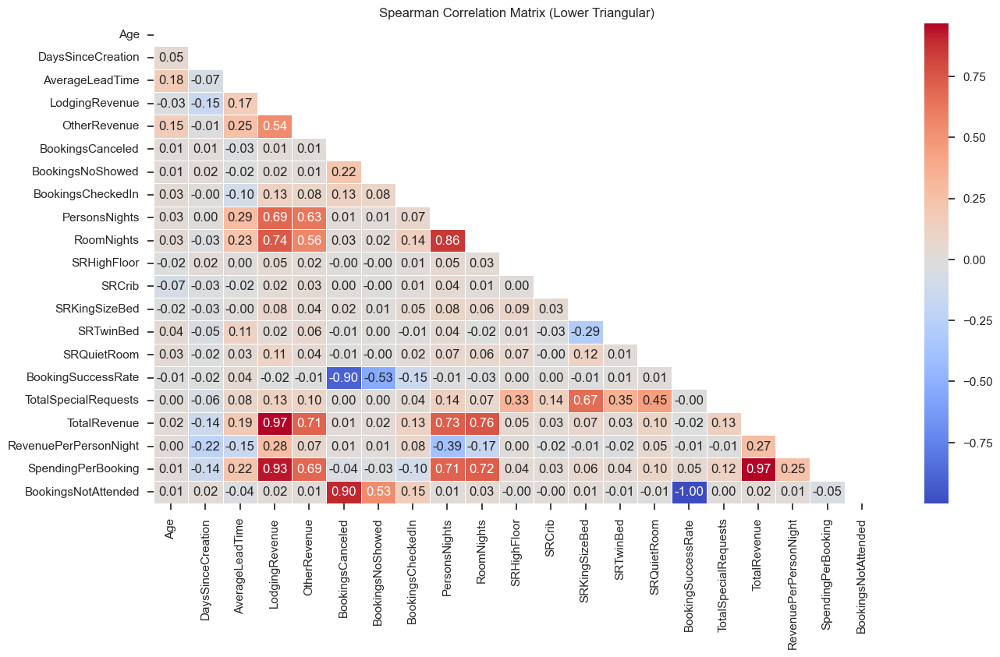

In [98]:
corr_matrix_spearman = ds_new.corr(method='spearman', numeric_only=True)

# Extract lower triangular part of the correlation matrix to have less noise
lower_triangular = corr_matrix_spearman.where(np.tril(np.ones(corr_matrix_spearman.shape), k=-1).astype(bool))
plt.figure(figsize=(15, 8))
sns.heatmap(lower_triangular, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Spearman Correlation Matrix (Lower Triangular)')
plt.show()


In [99]:
# Calculate correlation matrix just to complement the decision
correlation_matrix = ds_new[numeric_vars].corr()

lower_triangle = correlation_matrix.where(np.tril(np.ones(correlation_matrix.shape), k=-1).astype(bool))
correlation_series = lower_triangle.stack() #Each correlation one time
unique_correlations = correlation_series[abs(correlation_series) > 0.7]  # Filter out correlations below a threshold
unique_correlations

RoomNights           PersonsNights         0.827180
BookingSuccessRate   BookingsCanceled     -0.718205
TotalRevenue         LodgingRevenue        0.972708
SpendingPerBooking   LodgingRevenue        0.925425
                     TotalRevenue          0.952068
BookingsNotAttended  BookingsCanceled      0.925712
                     BookingSuccessRate   -0.783570
dtype: float64

So `TotalRevenue` has a strong correlation with `LodgingRevenue` and `SpendingPerBooking` (and this two also have a good relationship). We goona keep remove Total Revenue and leave the other 2 SpendingPerBooking is a good measure for future intrepertations but LodgingRevenue can help in the segemntation . 

Otherrevenue can stay to have a way to see if the customer spends in extras or not. 

As we said before, `RoomNights` and `personnights` have a strong correlation and we prefere to know if the person travels in large groups or not: we keep `personnights`

`BookingsCanceled` has a good negative correlation with `BookingSuccRate`. `BookingsNoShowed` are really rare and maybe they will be overlook diring the clustering and PCA so we are going to use  `BookingsNotAttended` as it more significant and is the combination of the 2 variables. This one can also be sustitute for BookingSuccRate but for now we are going to leave it.

`BookingsNotAttended` has a perfect negative correlation with `BookingSuccRate` and we prefer to the BookingSuccRate as it is imediatly more intutive. 

In [100]:
# Variables to remove
variables_to_remove = ['BookingsCanceled', 'BookingsNoShowed', 'RoomNights', 'TotalRevenue']

In [101]:
ds_new.drop(variables_to_remove, axis = 1, inplace=True) # BookingsNotAttended ? test in the PCA

In [102]:
# update Metric_features
for variable in variables_to_remove:
    numeric_vars.remove(variable)

In [103]:
ds_new.head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,DistributionChannel,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group
0,BRA,51.0,205,41,416.66,271.5,1,10,Travel Agent/Operator,0,0,1,0,0,1.0,1,68.8160,688.16,0,Middle Age (41-60)
1,CHE,25.0,908,66,384.00,58.5,1,8,Direct,0,0,0,0,0,1.0,0,55.3125,442.50,0,Young Adult (18-25)
2,FRA,39.0,651,24,234.00,28.0,1,4,Travel Agent/Operator,0,0,0,1,1,1.0,2,65.5000,262.00,0,Adult (26-40)
4,DEU,42.0,576,8,432.00,21.0,1,3,Travel Agent/Operator,0,0,0,0,0,1.0,0,151.0000,453.00,0,Middle Age (41-60)
5,FRA,30.0,1230,111,410.00,112.0,1,6,Travel Agent/Operator,0,0,0,0,0,1.0,0,87.0000,522.00,0,Adult (26-40)


 <a id = "Encoding"></a>

### 2.8.Encoding

[Back to Data Preparation](#Data-Preparation)

First step is reduce the cardinality of the Nationality columns

In [104]:
ds_Encoded = ds_new.copy()

In [105]:
unique_nationalities = ds_Encoded['Nationality'].unique().tolist()

In [106]:
country_continents = {
    'BRA': 'South_America',
    'CHE': 'Other_Europe',
    'FRA': 'Other_Europe',
    'DEU': 'Other_Europe',
    'CZE': 'Other_Europe',
    'AUT': 'Other_Europe',
    'JPN': 'Asia',
    'BEL': 'Other_Europe',
    'GBR': 'Other_Europe',
    'USA': 'North_America',
    'ESP': 'Other_Europe',
    'PRT': 'Portugal',
    'POL': 'Other_Europe',
    'CHL': 'South_America',
    'HUN': 'Other_Europe',
    'ISR': 'Asia',
    'NLD': 'Other_Europe',
    'MEX': 'North_America',
    'SWE': 'Other_Europe',
    'UKR': 'Other_Europe',
    'ARG': 'South_America',
    'ITA': 'Other_Europe',
    'GEO': 'Other_Europe',
    'IRL': 'Other_Europe',
    'ECU': 'South_America',
    'NOR': 'Other_Europe',
    'PAN': 'North_America',
    'DNK': 'Other_Europe',
    'LUX': 'Other_Europe',
    'RUS': 'Other_Europe',
    'CAN': 'North_America',
    'ZAF': 'Africa',
    'SVN': 'Other_Europe',
    'FIN': 'Other_Europe',
    'IND': 'Asia',
    'UZB': 'Asia',
    'COD': 'Africa',
    'JOR': 'Asia',
    'ROU': 'Other_Europe',
    'MAR': 'Africa',
    'GRC': 'Other_Europe',
    'MUS': 'Africa',
    'TUR': 'Asia',
    'CHN': 'Asia',
    'AUS': 'Oceania',
    'SRB': 'Other_Europe',
    'MLT': 'Other_Europe',
    'SGP': 'Asia',
    'LVA': 'Other_Europe',
    'ISL': 'Other_Europe',
    'EST': 'Other_Europe',
    'VEN': 'South_America',
    'MWI': 'Africa',
    'IRN': 'Asia',
    'BLR': 'Other_Europe',
    'IDN': 'Asia',
    'KOR': 'Asia',
    'DOM': 'North_America',
    'CMR': 'Africa',
    'SYR': 'Asia',
    'SVK': 'Other_Europe',
    'COL': 'South_America',
    'PHL': 'Asia',
    'MLI': 'Africa',
    'MOZ': 'Africa',
    'PER': 'South_America',
    'MYS': 'Asia',
    'HRV': 'Other_Europe',
    'CYP': 'Other_Europe',
    'AGO': 'Africa',
    'URY': 'South_America',
    'BGD': 'Asia',
    'NZL': 'Oceania',
    'BIH': 'Other_Europe',
    'BGR': 'Other_Europe',
    'ARM': 'Other_Europe',
    'THA': 'Asia',
    'DZA': 'Africa',
    'CRI': 'North_America',
    'SAU': 'Asia',
    'ATA': 'Antarctica',  
    'NGA': 'Africa',
    'AFG': 'Asia',
    'VNM': 'Asia',
    'CAF': 'Africa',
    'LTU': 'Other_Europe',
    'CPV': 'Africa',
    'AZE': 'Other_Europe',
    'KAZ': 'Asia',
    'GAB': 'Africa',
    'SMR': 'Other_Europe',
    'LBN': 'Asia',
    'TWN': 'Asia',
    'EGY': 'Africa',
    'TGO': 'Africa',
    'BOL': 'South_America',
    'GTM': 'North_America',
    'JAM': 'North_America',
    'PAK': 'Asia',
    'TUN': 'Africa',
    'UGA': 'Africa',
    'ARE': 'Asia',
    'QAT': 'Asia',
    'PRI': 'North_America',
    'BRB': 'North_America',
    'GHA': 'Africa',
    'SEN': 'Africa',
    'SLV': 'North_America',
    'IRQ': 'Asia',
    'BEN': 'Africa',
    'GIB': 'Other_Europe',
    'LIE': 'Other_Europe',
    'MDV': 'Asia',
    'OMN': 'Asia',
    'ERI': 'Africa',
    'CUB': 'North_America',
    'SDN': 'Africa',
    'MMR': 'Asia',
    'MCO': 'Other_Europe',
    'LAO': 'Asia',
    'MKD': 'Other_Europe',
    'ALB': 'Other_Europe',
    'ATF': 'Antarctica', 
    'ASM': 'Oceania',
    'ATG': 'North_America',
    'KGZ': 'Asia',
    'RWA': 'Africa',
    'NAM': 'Africa',
    'CIV': 'Africa',
    'LCA': 'North_America',
    'PRY': 'South_America',
    'KIR': 'Oceania',
    'WLF': 'Oceania',
    'LBY': 'Africa',
    'KEN': 'Africa',
    'GUY': 'South_America',
    'KWT': 'Asia',
    'JEY': 'Other_Europe',
    'BHR': 'Asia',
    'SUR': 'South_America',
    'CYM': 'North_America',
    'HKG': 'Asia',
    'YEM': 'Asia',
    'COM': 'Africa',
    'BWA': 'Africa',
    'LKA': 'Asia',
    'FRO': 'Other_Europe',
    'MDG': 'Africa',
    'TJK': 'Asia',
    'AIA': 'North_America',
    'SYC': 'Africa',
    'TCD': 'Africa',
    'SPM': 'North_America',
    'SLE': 'Africa',
    'SJM': 'Other_Europe',
    'BMU': 'North_America',
    'SOM': 'Africa',
    'TZA': 'Africa',
    'GRD': 'North_America',
    'TKM': 'Asia',
    'NIC': 'North_America',
    'ABW': 'North_America',
    'MNE': 'Other_Europe',
    'STP': 'Africa',
    'HTI': 'North_America',
    'NCL': 'Oceania',
    'GNB': 'Africa',
    'PCN': 'Oceania',
    'VIR': 'North_America',
    'AND': 'Other_Europe',
    'GUF': 'South_America',
    'WSM': 'Oceania',
    'SWZ': 'Africa',
    'FLK': 'South_America',
    'ETH': 'Africa',
    'ZWE': 'Africa',
    'MRT': 'Africa',
    'DMA': 'North_America',
    'FSM': 'Oceania'
}

In [107]:
ds_Encoded['Origin'] = ds_Encoded['Nationality'].map(country_continents)

In [108]:
unique_Regions = ds_Encoded['Origin'].unique().tolist()
unique_Regions

['South_America',
 'Other_Europe',
 'Asia',
 'North_America',
 'Portugal',
 'Africa',
 'Oceania',
 'Antarctica']

In [109]:
# We want to see if any of this categories are not significant enougth and can be put together 
region_counts = ds_Encoded['Origin'].value_counts()
total_samples = len(ds_Encoded)

#  percentage of each category
region_percentages = (region_counts / total_samples) * 100

print("Percentage of each category in the 'Origin' column:")
print(region_percentages)


Percentage of each category in the 'Origin' column:
Origin
Other_Europe     73.340953
Portugal         10.335972
North_America     6.619255
South_America     3.911442
Asia              3.871933
Africa            0.960928
Oceania           0.952462
Antarctica        0.007055
Name: count, dtype: float64


In [110]:
# Substituir os valores específicos por 'Others'
ds_Encoded['Origin'] = ds_Encoded['Origin'].replace(['Africa', 'Oceania', 'Antarctica', 'Asia'], 'Others')

# Calcular novamente a porcentagem de cada categoria
region_percentages = (ds_Encoded['Origin'].value_counts() / len(ds_Encoded)) * 100

print("Percentage of each category in the 'Origin' column")
print(region_percentages)

Percentage of each category in the 'Origin' column
Origin
Other_Europe     73.340953
Portugal         10.335972
North_America     6.619255
Others            5.792377
South_America     3.911442
Name: count, dtype: float64


In [111]:
ds_Encoded.head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,DistributionChannel,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin
0,BRA,51.0,205,41,416.66,271.5,1,10,Travel Agent/Operator,0,0,1,0,0,1.0,1,68.8160,688.16,0,Middle Age (41-60),South_America
1,CHE,25.0,908,66,384.00,58.5,1,8,Direct,0,0,0,0,0,1.0,0,55.3125,442.50,0,Young Adult (18-25),Other_Europe
2,FRA,39.0,651,24,234.00,28.0,1,4,Travel Agent/Operator,0,0,0,1,1,1.0,2,65.5000,262.00,0,Adult (26-40),Other_Europe
4,DEU,42.0,576,8,432.00,21.0,1,3,Travel Agent/Operator,0,0,0,0,0,1.0,0,151.0000,453.00,0,Middle Age (41-60),Other_Europe
5,FRA,30.0,1230,111,410.00,112.0,1,6,Travel Agent/Operator,0,0,0,0,0,1.0,0,87.0000,522.00,0,Adult (26-40),Other_Europe


In [112]:
ds_Encoded.dtypes #confirming the data types

Nationality               object
Age                      float64
DaysSinceCreation          int64
AverageLeadTime            int64
LodgingRevenue           float64
OtherRevenue             float64
BookingsCheckedIn          int64
PersonsNights              int64
DistributionChannel       object
SRHighFloor                int64
SRCrib                     int64
SRKingSizeBed              int64
SRTwinBed                  int64
SRQuietRoom                int64
BookingSuccessRate       float64
TotalSpecialRequests       int64
RevenuePerPersonNight    float64
SpendingPerBooking       float64
BookingsNotAttended        int64
Age Group                 object
Origin                    object
dtype: object

### <div class="alert-warning">Age Group and Nationality are not going to be encoded because they will serve as context after clustering.</div>

### <div class="alert-warning">Important: We know we dont have missing values in the categorical columns so they dont appear as a specific column. Otherwise, condition to ignore them should be consider</div>

In [113]:
def ohc(data):
    """
    Function to perform one-hot encoding on specific columns in the DataFrame.
    """
    columns_to_encode = ['Origin', 'DistributionChannel']
    ohc_data = pd.get_dummies(data, columns=columns_to_encode)  # One-hot encoding
    
    return ohc_data

In [114]:
ds_Encoded = ohc(ds_Encoded)

In [115]:
ds_Encoded.head(20).T

,0,1,2,4,5,7,9,10,11,12,13,14,15,16,17,20,21,23,24,25
Nationality,BRA,CHE,FRA,DEU,FRA,CZE,AUT,FRA,FRA,JPN,FRA,AUT,BEL,BRA,GBR,DEU,DEU,USA,ESP,PRT
Age,51.0,25.0,39.0,42.0,30.0,41.0,53.0,70.0,29.0,33.0,51.0,32.0,60.0,73.0,69.0,65.0,73.0,50.0,43.0,59.0
DaysSinceCreation,205,908,651,576,1230,578,863,1247,1144,1333,1192,1194,810,767,576,131,1282,1239,1043,677
AverageLeadTime,41,66,24,8,111,92,198,75,53,6,70,28,158,59,53,20,170,13,4,6
LodgingRevenue,416.66,384.0,234.0,432.0,410.0,234.0,412.84,1192.05,386.1,765.36,183.0,403.1,1066.5,134.0,360.67,186.0,330.0,315.33,88.0,117.0
OtherRevenue,271.5,58.5,28.0,21.0,112.0,28.0,56.0,185.5,44.5,93.23,28.0,22.0,319.5,7.0,48.8,48.0,70.0,8.0,158.0,23.0
BookingsCheckedIn,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
PersonsNights,10,8,4,3,6,4,8,27,6,8,4,6,6,1,8,4,10,9,2,2
SRHighFloor,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
SRCrib,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<a id = "Normalization"></a>

### Scaling

[Back to Data Preparation](#Data-Preparation)

Research:
https://www.linkedin.com/advice/0/what-benefits-drawbacks-different-normalization
https://www.linkedin.com/advice/0/how-can-you-avoid-common-mistakes-when-iq29e
https://engineering.teknasyon.com/how-to-normalize-your-unsupervised-data-for-clustering-methods-9389298d20d5
We decidec to use the Min-Max Scaling: it will scale the data to a fixed range while preserving the original distribution. This means that the relative relationships between data points will be maintained, which can be important if the original distribution carries information for clustering analysis.

By using this normalization technique, each feature is scaled proportionally within the specified range (typically between 0 and 1), while preserving the original distribution and relative differences between data points. This can help k-means clustering to better capture the underlying structure of your data without introducing biases due to differing scales.

Since the Min-Max Scaling is sensitive to outliers because it scales the data based on the minimum and maximum values in the dataset, we treated the outliers first.

In [116]:
def min_max_normalize(data):
    """
    Perform Min-Max normalization on numeric columns of the DataFrame.

    """
    scaler = MinMaxScaler()

    # columns to be normalized (excluding non-numeric columns)
    numeric_columns = data.select_dtypes(include=[np.number]).columns

    # Apply Min-Max normalization
    data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

    return data

In [117]:
ds_minmax = ds_Encoded.copy()

In [118]:
ds_normalized = min_max_normalize(ds_minmax)

In [119]:
ds_normalized.head(2)

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator
0,BRA,0.417722,0.125278,0.112637,0.166731,0.274242,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.031082,0.219404,0.0,Middle Age (41-60),False,False,False,False,True,False,False,False,True
1,CHE,0.088608,0.646405,0.181319,0.153661,0.059091,0.038462,0.140351,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.024983,0.141081,0.0,Young Adult (18-25),False,True,False,False,False,False,True,False,False


#### now we have the base of our columns all numeric, and the columns Nationality and Age Group to give context to our data after the clustering. 

In [120]:
numeric_description = ds_normalized.describe()
numeric_description_transposed = numeric_description.transpose().round(2)
numeric_description_transposed

,count,mean,std,min,25%,50%,75%,max
Age,70626.0,0.38,0.18,0.0,0.24,0.38,0.51,1.0
DaysSinceCreation,70869.0,0.48,0.28,0.0,0.25,0.49,0.72,1.0
AverageLeadTime,70869.0,0.23,0.22,0.0,0.05,0.16,0.36,1.0
LodgingRevenue,70869.0,0.16,0.13,0.0,0.08,0.13,0.20,1.0
OtherRevenue,70869.0,0.09,0.10,0.0,0.03,0.06,0.12,1.0
BookingsCheckedIn,70869.0,0.04,0.02,0.0,0.04,0.04,0.04,1.0
PersonsNights,70869.0,0.11,0.08,0.0,0.05,0.11,0.14,1.0
SRHighFloor,70869.0,0.04,0.20,0.0,0.00,0.00,0.00,1.0
SRCrib,70869.0,0.01,0.10,0.0,0.00,0.00,0.00,1.0
SRKingSizeBed,70869.0,0.36,0.48,0.0,0.00,0.00,1.00,1.0


Everything seems fine min 0 max 1, normalization done. Focusing on the Age row to check if it will be altered by the imputation of the k-Nearest Neighbor. (we expect that will not)

 <a id = "Missing-values"></a>

### Missing values

[Back to Data Preparation](#Data-Preparation)

In [121]:
ds_scaled_clean = ds_normalized.copy()

In [122]:
missing_values = ['-', '--', 'NA', 'N/A', 'NaN', 'NULL', 'None', 'Unknown', 'Undefined', 'na', 'n/a', 'unknow', 'Unknown'] #more types of missing values 

In [123]:
for value in missing_values:
    ds_scaled_clean.replace(value, np.nan, inplace=True)

ds_scaled_clean.isna().sum()

Nationality                                    0
Age                                          243
DaysSinceCreation                              0
AverageLeadTime                                0
LodgingRevenue                                 0
OtherRevenue                                   0
BookingsCheckedIn                              0
PersonsNights                                  0
SRHighFloor                                    0
SRCrib                                         0
SRKingSizeBed                                  0
SRTwinBed                                      0
SRQuietRoom                                    0
BookingSuccessRate                             0
TotalSpecialRequests                           0
RevenuePerPersonNight                          1
SpendingPerBooking                             0
BookingsNotAttended                            0
Age Group                                    243
Origin_North_America                           0
Origin_Other_Europe 

In [124]:
# Replacing the missing value in 'RevenuePerPersonNight' column with 0 as we said before
ds_scaled_clean['RevenuePerPersonNight'].fillna(0, inplace=True)

In [125]:
rows_with_missing_values = ds_scaled_clean[ds_scaled_clean.isna().any(axis=1)]
rows_with_missing_values.head(5)

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator
324,PRT,NaN,0.683469,0.000000,0.119728,0.008081,0.038462,0.140351,0.0,0.0,0.0,0.0,0.0,1.00,0.0,0.017344,0.097944,0.00,NaN,False,False,False,True,False,False,False,False,True
836,PRT,NaN,0.977761,0.035714,0.276110,0.098485,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.00,0.2,0.035569,0.251076,0.00,NaN,False,False,False,True,False,False,True,False,False
907,PRT,NaN,0.388436,0.010989,0.094438,0.038889,0.115385,0.070175,0.0,0.0,0.0,0.0,0.0,0.75,0.0,0.030996,0.021879,0.25,NaN,False,False,False,True,False,True,False,False,False
1241,PRT,NaN,0.796887,0.175824,0.107467,0.058586,0.038462,0.105263,0.0,0.0,0.0,0.0,0.0,1.00,0.0,0.024583,0.104116,0.00,NaN,False,False,False,True,False,False,False,False,True
2133,PRT,NaN,0.948851,0.076923,0.154862,0.118182,0.038462,0.105263,0.0,0.0,0.0,0.0,0.0,1.00,0.0,0.037940,0.160689,0.00,NaN,False,False,False,True,False,False,False,False,True


In [126]:
mean_days_since_creation = rows_with_missing_values['DaysSinceCreation'].mean()
mean_days_since_creation

0.6740521099305384

Trend in older records as we said before, maybe due to lack of standard procedures or manual imputation need. 

Research: https://medium.com/@bhanupsingh484/handling-missing-data-with-knn-imputer-927d49b09015
To deal with this missing values we can: 
    - delete them: the rest of the variables seem fine, we dont want to eliminate them.
    - Imputation with a constant: in this case the Mean or the Median. So `Measure of central tendency` should be use, in this case the median beacause if the distribution is
skewed, the median could be better. 
    - KNN Imputer - utilizes the k-Nearest Neighbors to replace missing values  (uses Euclidean distance). Requires data normalization otherwise will generate biased replacements. Again we want to preserve the original data relationship, and since we already normalize the data we are going to choose this one.

In [127]:
def impute_missing_age_knn(data, n_neighbors=5):
    """
    Impute missing values in the 'Age' column using k-Nearest Neighbors.

    """
    imputer = KNNImputer(n_neighbors=n_neighbors)
    data['Age'] = imputer.fit_transform(data[['Age']])
    return data

In [128]:
ds_scaled_clean = impute_missing_age_knn(ds_scaled_clean)

In [129]:
# We use this code to see the range where the value 0.38218758 falls and it was in the Midlle Age range
#unique_age_group_not_null = ds_scaled_clean1.dropna(subset=['Age Group']).drop_duplicates(subset=['Age'])[['Age', 'Age Group']]

# DataFrame com valores únicos de 'Age' onde 'Age Group' é NaN
#unique_age_group_null = ds_scaled_clean1[ds_scaled_clean1['Age Group'].isnull()][['Age']]

# Concatenar os dois DataFrames
#unique_age_group = pd.concat([unique_age_group_not_null, unique_age_group_null], ignore_index=True)

# Exibir o DataFrame resultante
#unique_age_group

In [130]:
# Replacing the missing value Age Gourp where 'Age' == 0.382188 e atribuir 'Middle Age (41-60)' para 'Age Group'
ds_scaled_clean['Age Group'].fillna('Middle Age (41-60)', inplace=True)

In [131]:
ds_scaled_clean.isna().sum()

Nationality                                  0
Age                                          0
DaysSinceCreation                            0
AverageLeadTime                              0
LodgingRevenue                               0
OtherRevenue                                 0
BookingsCheckedIn                            0
PersonsNights                                0
SRHighFloor                                  0
SRCrib                                       0
SRKingSizeBed                                0
SRTwinBed                                    0
SRQuietRoom                                  0
BookingSuccessRate                           0
TotalSpecialRequests                         0
RevenuePerPersonNight                        0
SpendingPerBooking                           0
BookingsNotAttended                          0
Age Group                                    0
Origin_North_America                         0
Origin_Other_Europe                          0
Origin_Others

In [132]:
descrip_After_MV = ds_scaled_clean.describe()
descrip_After_MV_transposed = descrip_After_MV.transpose().round(2)
descrip_After_MV_transposed.head(1)

,count,mean,std,min,25%,50%,75%,max
Age,70869.0,0.38,0.18,0.0,0.24,0.38,0.51,1.0


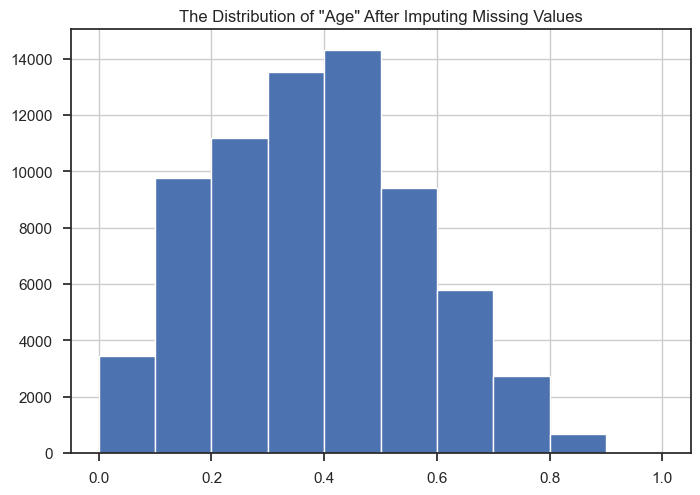

In [133]:
ds_scaled_clean.Age.hist()
plt.title('The Distribution of "Age" After Imputing Missing Values')
plt.show()

#### <div class="alert-success"> Exactly the same results, the imputation method worked.</div>

In [134]:
ds_Encoded['Age Group'] = ds_Encoded['Age Group'].replace('Unknown', 'Middle Age (41-60)')

 <a id = "PCA"></a>

### Principal Component Analysis

[Back to Data Preparation](#Data-Preparation)

https://www.reneshbedre.com/blog/principal-component-analysis.html#perform-pca-in-python 'PCA is a classical multivariate (unsupervised machine learning) non-parametric dimensionality reduction method that used to interpret the variation in high-dimensional interrelated dataset (dataset with a large number of variables). PCA reduces the high-dimensional interrelated data to low-dimension by linearly transforming the old variable into a new set of uncorrelated variables called principal component (PC) while retaining the most possible variation.'



We have made a pre-selection of variables, but cluestering, our goal, works best with a limited number of variables. This allows faster computation. Using PCA we can find the attributes that represent the biggest variability a

In [135]:
#ds_scaled_clean.to_excel(r"C:\Users\catar\OneDrive\Ambiente de Trabalho\ds_scaled_clean.xlsx", index=False) save the dataset for extra analysis 

In [136]:
ds_pca = ds_scaled_clean.copy()

In [137]:
ds_pca.head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator
0,BRA,0.417722,0.125278,0.112637,0.166731,0.274242,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.031082,0.219404,0.0,Middle Age (41-60),False,False,False,False,True,False,False,False,True
1,CHE,0.088608,0.646405,0.181319,0.153661,0.059091,0.038462,0.140351,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.024983,0.141081,0.0,Young Adult (18-25),False,True,False,False,False,False,True,False,False
2,FRA,0.265823,0.455893,0.065934,0.093637,0.028283,0.038462,0.070175,0.0,0.0,0.0,1.0,1.0,1.0,0.4,0.029584,0.083533,0.0,Adult (26-40),False,True,False,False,False,False,False,False,True
4,DEU,0.303797,0.400297,0.021978,0.172869,0.021212,0.038462,0.052632,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.068202,0.144429,0.0,Middle Age (41-60),False,True,False,False,False,False,False,False,True
5,FRA,0.151899,0.885100,0.304945,0.164066,0.113131,0.038462,0.105263,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.039295,0.166428,0.0,Adult (26-40),False,True,False,False,False,False,False,False,True


In [138]:
numeric_vars

['Age',
 'DaysSinceCreation',
 'AverageLeadTime',
 'LodgingRevenue',
 'OtherRevenue',
 'BookingsCheckedIn',
 'PersonsNights',
 'BookingSuccessRate',
 'TotalSpecialRequests',
 'RevenuePerPersonNight',
 'SpendingPerBooking',
 'BookingsNotAttended']

In [139]:
PCA_variables = [
    'Age',
    'DaysSinceCreation',
    'AverageLeadTime',
    'LodgingRevenue',
    'OtherRevenue',
    'BookingsCheckedIn',
    'PersonsNights',
    'BookingSuccessRate',
    'TotalSpecialRequests',
    'RevenuePerPersonNight',
    'SpendingPerBooking',
    'BookingsNotAttended']

In [140]:
ds_pca_variables = ds_pca[PCA_variables]

In [141]:
X = ds_pca_variables.values

So first we need to figure out how many components we want to use for our PCA. To do this, we did some research and found out that visualizing techniques that can help. Also decided to set a minimal threshold of 0.95 for the cumulative explained variance to retain at least 95% of the variance in my data after dimensionality reduction. It's a good rule to ensure we're not losing too much information.

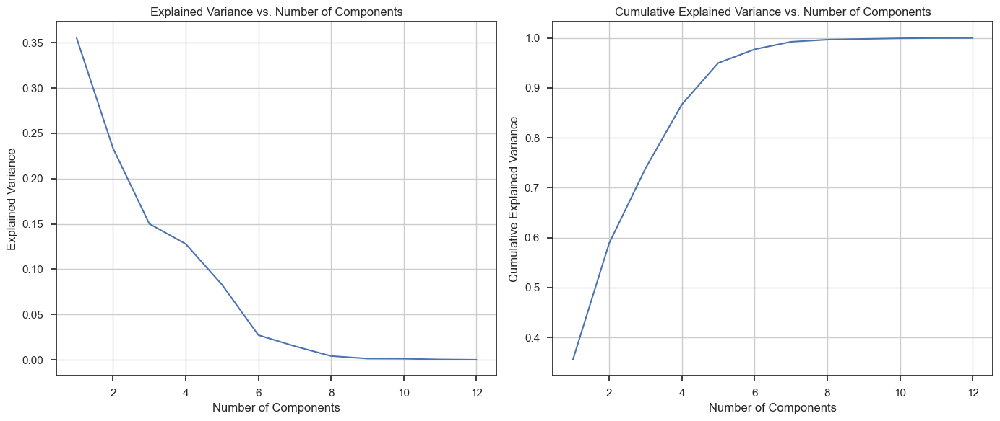

Ideal number of components: 5


In [142]:
# Create a PCA object
pca = PCA()
pca.fit(X)

# Calculate measures
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Plot visuals
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# explained variance ratio
axs[0].plot(np.arange(1, len(explained_variance) + 1), explained_variance)
axs[0].set_xlabel('Number of Components')
axs[0].set_ylabel('Explained Variance')
axs[0].set_title('Explained Variance vs. Number of Components')
axs[0].grid(True)

# cumulative explained variance
axs[1].plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance)
axs[1].set_xlabel('Number of Components')
axs[1].set_ylabel('Cumulative Explained Variance')
axs[1].set_title('Cumulative Explained Variance vs. Number of Components')
axs[1].grid(True)

plt.tight_layout()
plt.show()

threshold = 0.95  #  threshold for the rate of change in explained variance
n_components = np.argmax(cumulative_variance > threshold) + 1

print(f"Ideal number of components: {n_components}")

### <div class="alert-success">We can see a Ideal number of 5. Visually, using the Elbow method, its also possible to see that the Ideal goes between 5 and 8. 95% seems a good trade off to have less compponents and improve the rest of the algorithm.</div>

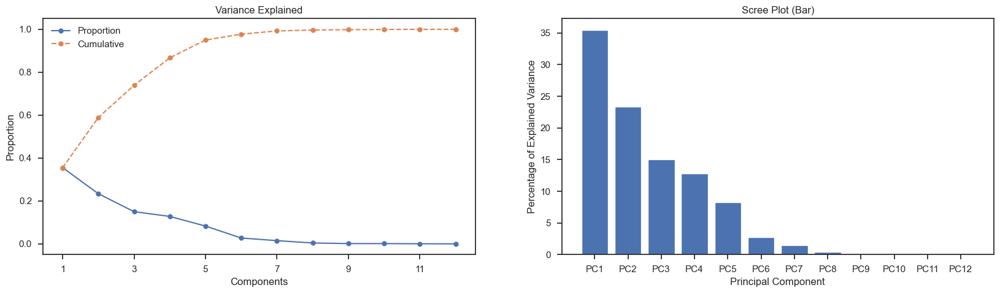

In [143]:
# Visualize explained variance using scree plot and explained variance ratio plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))

# Explained variance ratio plot
ax1.plot(pca.explained_variance_ratio_, marker='.', markersize=12, label='Proportion')
ax1.plot(np.cumsum(pca.explained_variance_ratio_), marker='.', markersize=12, linestyle='--',
         label='Cumulative')
ax1.legend()
ax1.set_title('Variance Explained')
ax1.set_ylabel('Proportion')
ax1.set_xlabel('Components')
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))

per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]


ax2.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
ax2.set_ylabel('Percentage of Explained Variance')
ax2.set_xlabel('Principal Component')
ax2.set_title('Scree Plot (Bar)')


plt.show()


In [144]:
#table
pd.DataFrame({
    'Eigenvalue': pca.explained_variance_,
    'Difference': np.insert(np.diff(pca.explained_variance_), 0, 0),
    'Proportion': pca.explained_variance_ratio_,
    'Cumulative': np.cumsum(pca.explained_variance_ratio_)
}, index=range(1, pca.n_components_ + 1))

,Eigenvalue,Difference,Proportion,Cumulative
1,0.079730,0.000000,0.355246,0.355246
2,0.052465,-0.027265,0.233762,0.589008
3,0.033697,-0.018768,0.150141,0.739149
4,0.028723,-0.004974,0.127979,0.867128
5,0.018612,-0.010111,0.082927,0.950055
6,0.006125,-0.012487,0.027289,0.977345
7,0.003387,-0.002738,0.015089,0.992434
8,0.000951,-0.002436,0.004238,0.996671
9,0.000322,-0.000629,0.001436,0.998107
10,0.000287,-0.000036,0.001277,0.999384


confirming the decision. Now its time to add to the dataset 

In [145]:
# PCA object
pca = PCA(n_components=n_components)
PCA_variables_transformed = pca.fit_transform(X)

# column names for the PCA components
pca_component_names = [f'PCA_Component_{i+1}' for i in range(n_components)]

# Add PCA components to the ds_pca DataFrame
for i, col in enumerate(pca_component_names):
    ds_pca[col] = PCA_variables_transformed[:, i]

In [146]:
ds_pca.head().T

,0,1,2,4,5
Nationality,BRA,CHE,FRA,DEU,FRA
Age,0.417722,0.088608,0.265823,0.303797,0.151899
DaysSinceCreation,0.125278,0.646405,0.455893,0.400297,0.8851
AverageLeadTime,0.112637,0.181319,0.065934,0.021978,0.304945
LodgingRevenue,0.166731,0.153661,0.093637,0.172869,0.164066
OtherRevenue,0.274242,0.059091,0.028283,0.021212,0.113131
BookingsCheckedIn,0.038462,0.038462,0.038462,0.038462,0.038462
PersonsNights,0.175439,0.140351,0.070175,0.052632,0.105263
SRHighFloor,0.0,0.0,0.0,0.0,0.0
SRCrib,0.0,0.0,0.0,0.0,0.0


In [147]:
# Def function to color the DataFrame based on correlation
def _color_corr(val):
    """
    Function that colors the DataFrame background with green (or red) if there is a positive (or negative) strong correlation.
    """
    if val < -0.70:
        color = 'background-color: #f87c7a'
    elif val > 0.70:
        color = 'background-color: #86e4b8'
    else:
        color = ''
    return color

# Compute loadings
loadings = ds_pca.corr(numeric_only=True).loc[PCA_variables, pca_component_names]
styled_loadings = loadings.style.applymap(_color_corr)  # Change this line
styled_loadings

,PCA_Component_1,PCA_Component_2,PCA_Component_3,PCA_Component_4,PCA_Component_5
Age,-0.035028,0.507884,-0.490665,0.706458,0.013757
DaysSinceCreation,-0.987610,0.127549,0.089198,-0.016395,0.007134
AverageLeadTime,0.195638,0.911774,-0.006452,-0.359740,-0.026113
LodgingRevenue,0.221716,0.186293,0.817609,0.374230,-0.101246
OtherRevenue,0.094857,0.283242,0.540437,0.351875,-0.090413
BookingsCheckedIn,-0.022742,-0.031236,0.069226,0.093881,0.027822
PersonsNights,0.087461,0.284000,0.603600,0.225005,-0.038713
BookingSuccessRate,0.015846,0.017368,0.000531,-0.021277,-0.001002
TotalSpecialRequests,0.087231,0.097459,0.181933,0.042889,0.973546
RevenuePerPersonNight,0.136275,-0.080396,0.282106,0.209559,-0.107703


In this way, we can quickly see which features are most important for each component:

We can see a lack of representations of the variables 'BookingsCheckedIn', 'RevenuePerPersonNight', 'BookingsNotAttended'. It's not ideal but expected since they have a very low variance - most of the people have 1 booking and 0 or 1 'BookingsNotAttended'. We're going to try to find a pattern after the clustering.

In [148]:
ds_pca.head(1)

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator,PCA_Component_1,PCA_Component_2,PCA_Component_3,PCA_Component_4,PCA_Component_5
0,BRA,0.417722,0.125278,0.112637,0.166731,0.274242,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.031082,0.219404,0.0,Middle Age (41-60),False,False,False,False,True,False,False,False,True,0.346413,-0.100184,0.052116,0.156309,0.04578


In [149]:
ds_final = ds_pca.copy()

#### Correlation Matrix after PCA

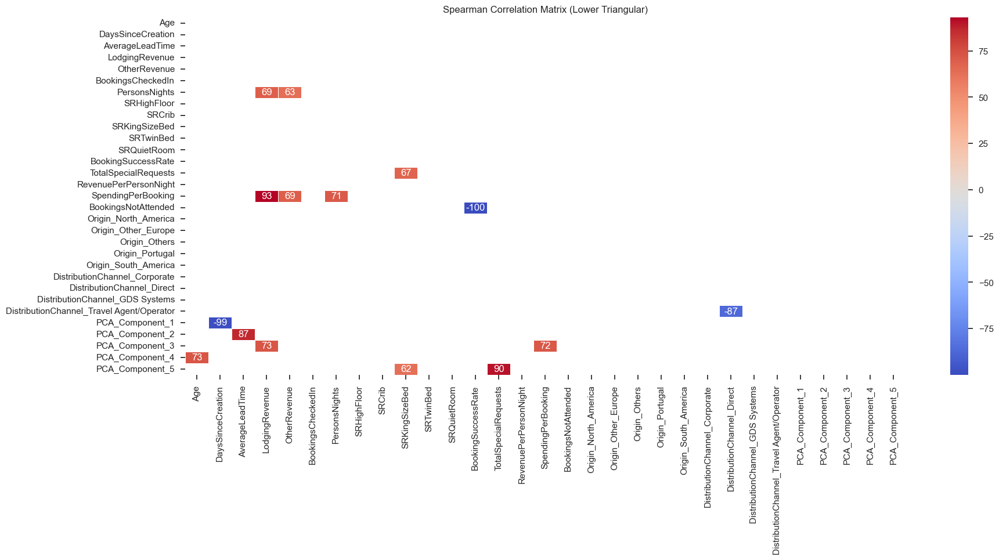

In [150]:
corr_matrix_spearman = ds_final.corr(method='spearman', numeric_only=True)
lower_triangular = corr_matrix_spearman.where(np.tril(np.ones(corr_matrix_spearman.shape), k=-1).astype(bool))

#check correlations
mask = (lower_triangular > 0.6) | (lower_triangular < -0.6)
plt.figure(figsize=(20, 8))
sns.heatmap(lower_triangular[mask] * 100, annot=True, cmap='coolwarm', fmt=".0f", linewidths=0.5)
plt.title('Spearman Correlation Matrix (Lower Triangular)')
plt.show()


.....

<a id = "Data-Modeling:KM"></a>
    
## 3. Data Modeling: K-Means Clustering
 
 - [3.1. Number of Ideal Clusters](#KNumber)
 - [3.2. Clustering solution](#KmeansSolution)
    
[Back to Index](#Index)


For this part we need to start by choosing the number of clusters. The Elbow method was not being effective and difficult to read so we have done some research and found a article with new approaches to find the ideal number of clusters: https://medium.com/geekculture/stop-using-the-elbow-method-96bcfbbbe9fd

We use the code of this author.

'The K-means algorithm performs the following steps:

- 1. Choose the number (K) of clusters
- 2. Specify the cluster seeds (Define the initial position of the centroids)
- 3. Assign each point to a centroid based on its proximity (if the centroid is the nearest centroid to the point, then assign to, do this for all points)
- 4. Adjust the centroid (recalculate the position of each centroid based in the points assigned to them)
- 5. Repeat step 3 and 4, until achieving a stop criterion
- 6. After achieve a stop criteria, end execution.'

<a id = "KNumber"></a>

### 3.1. Number of Ideal Clusters

- The Elbow Method
- Silhouette Score
- Silhouette Diagram

[Back to Data Modeling](#Data-Modeling:KM)

In [151]:
ds_kmeans = ds_final.copy()

In [152]:
# List of columns to use
Kmeans_features = ['PCA_Component_1', 'PCA_Component_2', 'PCA_Component_3', 'PCA_Component_5']

In [153]:
kmeans_var = ds_kmeans[Kmeans_features].copy()

In [154]:
SEED = 42

#### The Elbow Method

In [155]:
# empty list to store inertia values
iner = []

# inertia for the number of clusters selected 
for i in range(2, 15):
    kmeans = KMeans(n_clusters=i, n_init=10).fit(kmeans_var)
    iner.append(kmeans.inertia_)

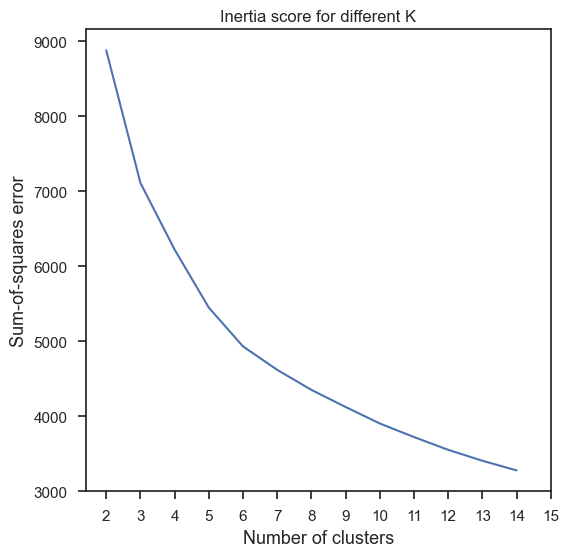

In [156]:
# Creates x axis for the plot with number of clusters
xs = np.arange(2, 15, 1)

# Creates figure and plot
fig, ax1 = plt.subplots(figsize=(6,6))
ax1.plot(xs, iner)
ax1.set_title('Inertia score for different K')
ax1.set_xlabel('Number of clusters', fontsize=13)
ax1.set_xticks([2,3,4,5,6,7,8,9,10,11,12,13,14,15])
ax1.set_ylabel('Sum-of-squares error', fontsize=13)

plt.show()

its not super clear the exact number of ideal clusters but we can see a small concavity between 3 and 6. We need to test other mehtods to make a decision.

#### Silhouette Score

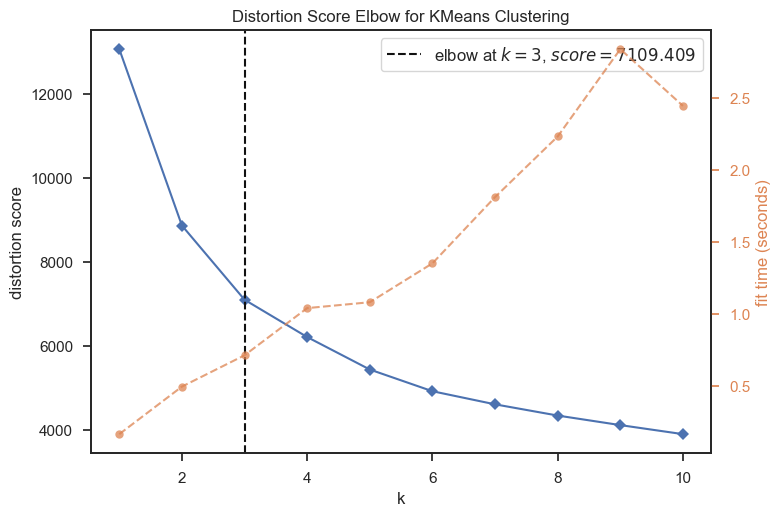

In [157]:
# Instantiate the KMeans model with a fixed random state
kmeans = KMeans(n_init=10, random_state=0)

# Instantiate the visualizer with the model and a range of k from 1 to 11
visualizer = KElbowVisualizer(kmeans, k=(1, 11))

# Fit the visualizer to the data
visualizer.fit(kmeans_var)  

# Visualize the plot
visualizer.show()
plt.show()

# Source Chat GPT

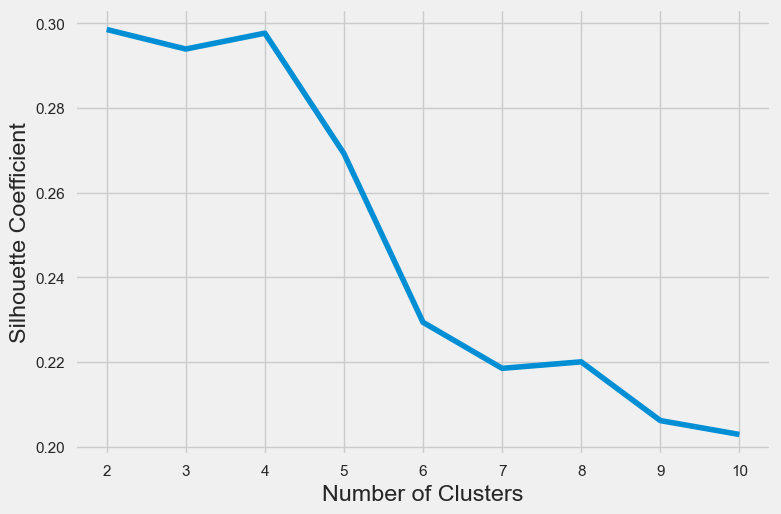

In [158]:
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": SEED,
}

# large range to analyze better
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(kmeans_var)
    score = silhouette_score(kmeans_var, kmeans.labels_)
    silhouette_coefficients.append(score)

# Plot silhouette coefficients
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

### <div class="alert-success">The best number of clusters to segment the data is k = 4.
<div class="alert-success">'The silhouette score is the mean silhouette coefficient over all instances of the dataset. The silhouette coefficient measures how close a point in one cluster is to points in the neighboring clusters, it ranges from -1 to 1.'
</div>

#### Silhouette Diagram

For n_clusters = 3 The average silhouette_score is : 0.29396894962722075
For n_clusters = 4 The average silhouette_score is : 0.29739229848395704
For n_clusters = 5 The average silhouette_score is : 0.26912650981444747


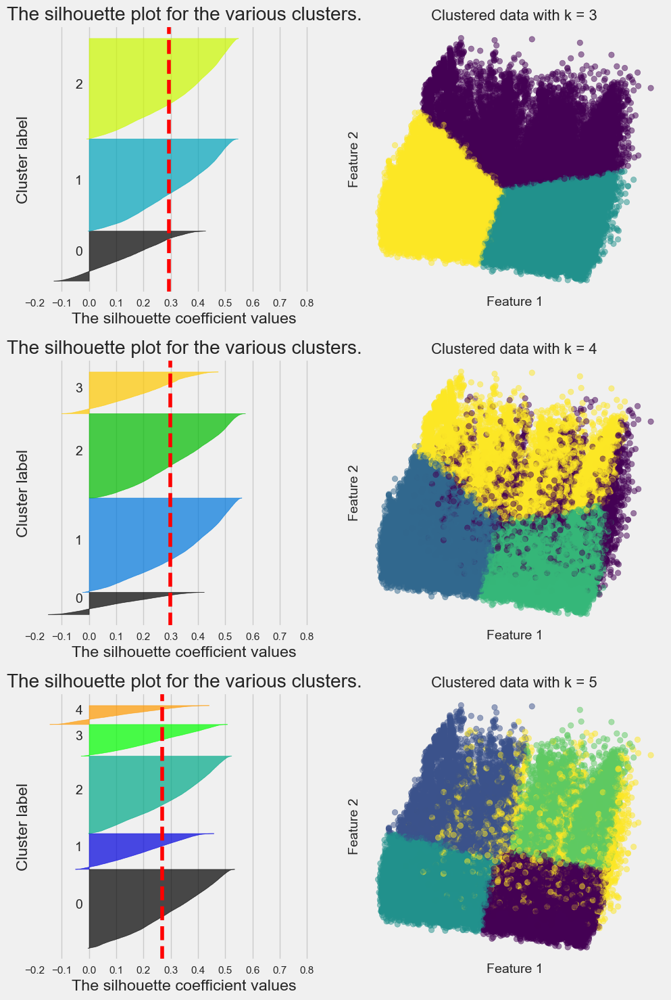

In [159]:
# number of clusters to test - based on the previous insights 
range_n_clusters = [3, 4, 5]

#subplot grid
fig, axs = plt.subplots(len(range_n_clusters), 2, figsize=(10, len(range_n_clusters) * 5))

for row, n_clusters in enumerate(range_n_clusters):
    # clusterer 
    clusterer = KMeans(n_clusters=n_clusters, n_init=10, random_state=SEED)
    cluster_labels = clusterer.fit_predict(kmeans_var)

    # Silhouette plot
    ax1 = axs[row, 0]

    # The silhouette coefficient can range from -1, 1 but in this case all lie within [-0.2, 0.9]
    ax1.set_xlim([-0.2, 0.9])
    ax1.margins(0.05)

    # The silhouette_score gives the average value for all the samples. This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(kmeans_var, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Computing the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(kmeans_var, cluster_labels)

    y_lower = 10

    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Computing the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([]) 
    ax1.set_xticks([-0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])

    # Additional plot
    ax2 = axs[row, 1]
    ax2.set_title(f"Clustered data with k = {n_clusters}", fontsize=16)
    
    ax2.scatter(kmeans_var.values[:, 0], kmeans_var.values[:, 1], c=cluster_labels, cmap='viridis', marker='o', alpha=0.5)
    
    ax2.set_xlabel("Feature 1", fontsize=14)
    ax2.set_ylabel("Feature 2", fontsize=14)
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.grid(False)

plt.tight_layout()
plt.savefig("silhouette_diagram.png", dpi=650, transparent=False)
plt.show()


Having the max silhouette_score of aprox 0.30 its not ideal, normally they should lay above 0.5 (a good separation), we gonna work on that. But right now, this is what we have with the PCA variables. 

#### Final Decision K = 4

<a id = "KmeansSolution"></a>

### 3.2. Clustering solution

[Back to Data Modeling](#Data-Modeling:KM)

In [160]:
def r2(data, labels):
    
    # Compute the sum of squares total (SST)
    sst = get_SS(data)
    
    # Compute the sum of squares within (SSW)
    ssw = np.sum(data.groupby(labels).apply(get_SS))
    
    # Calculate R-squared
    r_squared = 1 - ssw / sst
    return r_squared

In [161]:
def get_SS(data):
    """
    Computes the sum of squares for all variables given a dataset.
    """
    # Calculate the sum of squares for each variable
    ss = np.sum(data.var() * (data.count() - 1))
    return ss

In [162]:
# Function to visualize sizes and distances of clusters created by KMeans clustering
def cluster_size_distance(data, kmeans):
    visualizer = InterclusterDistance(kmeans, random_state=5)
    visualizer.fit(data)
    visualizer.show()

In [163]:
# Initialize KMeans clustering K = 
kmeans = KMeans(n_clusters=4, random_state=SEED)

# Obtain the clusters
labels = kmeans.fit_predict(kmeans_var)

# Add the cluster labels to the original data
ds_kmeans['Cluster'] = labels


C:\Users\pcata\anaconda3\envs\datamining\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [164]:
ds_kmeans.head(1)

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator,PCA_Component_1,PCA_Component_2,PCA_Component_3,PCA_Component_4,PCA_Component_5,Cluster
0,BRA,0.417722,0.125278,0.112637,0.166731,0.274242,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.031082,0.219404,0.0,Middle Age (41-60),False,False,False,False,True,False,False,False,True,0.346413,-0.100184,0.052116,0.156309,0.04578,2


Acrescentar a coluna no Dataframe com os dados normais: 

In [165]:
ds_Encoded = pd.merge(ds_Encoded, ds_kmeans[['Cluster']], left_index=True, right_index=True)

In [166]:
ds_Encoded.head(1)

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator,Cluster
0,BRA,51.0,205,41,416.66,271.5,1,10,0,0,1,0,0,1.0,1,68.816,688.16,0,Middle Age (41-60),False,False,False,False,True,False,False,False,True,2


In [167]:
#ds_Encoded.to_excel(r"C:\Users\catar\OneDrive\Ambiente de Trabalho\ds_Encoded.xlsx", index=False) save the dataset for extra analysis 

In [168]:
# size of each cluster
cluster_sizes = pd.Series(labels).value_counts().sort_index()

# centroid distances
centroid_distances = kmeans.transform(kmeans_var)
average_distances = centroid_distances.mean(axis=0)

# within-cluster sum of squares (WCSS)
wcss = kmeans.inertia_

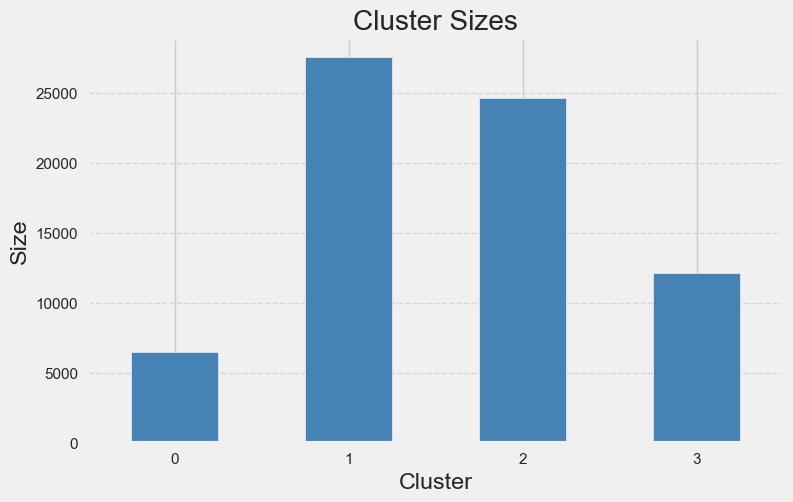

In [169]:
# Visualize Cluster Sizes
plt.figure(figsize=(8, 5))
cluster_sizes.plot(kind='bar', color='steelblue')
plt.title('Cluster Sizes')
plt.xlabel('Cluster')
plt.ylabel('Size')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

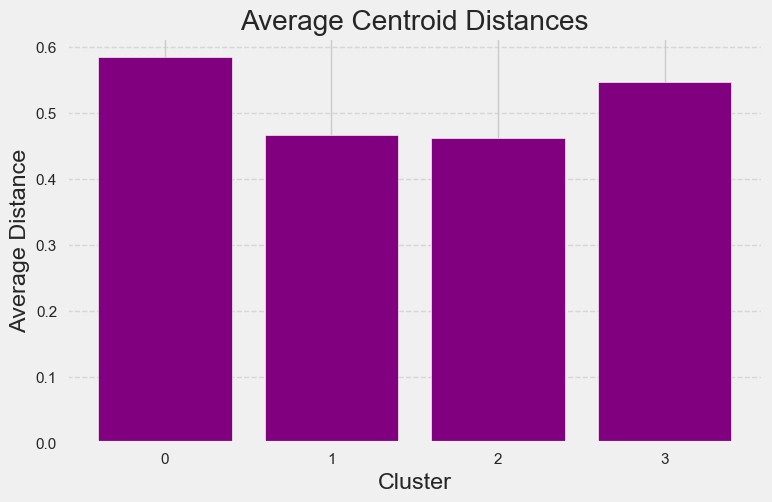

In [170]:
# Visualize Average Centroid Distances
plt.figure(figsize=(8, 5))
plt.bar(range(len(average_distances)), average_distances, color='purple')
plt.title('Average Centroid Distances')
plt.xlabel('Cluster')
plt.ylabel('Average Distance')
plt.xticks(range(len(average_distances)))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [171]:
# Print Total within-cluster sum of squares (WCSS)
print(f"Total within-cluster sum of squares (WCSS): {wcss}")

Total within-cluster sum of squares (WCSS): 6221.096282488419


- Cluster Sizes: Cluster sizes vary, which is not necessarily a problem. However, if there's a imbalance (e.g., cluster 3 is smaller than others), it may warrant further investigation. This can be a niche segment. 
- Average Centroid Distances: Lower centroid distances indicate tighter clusters, suggesting that data points within each cluster are more similar to each other. The distances seem reasonable, with Cluster 1 having the lowest average distance, indicating it may be the most cohesive cluster.
- Total within-cluster sum of squares (WCSS): The WCSS value seems moderate, but its adequacy depends on the context of your data and the specific goals of your analysis.

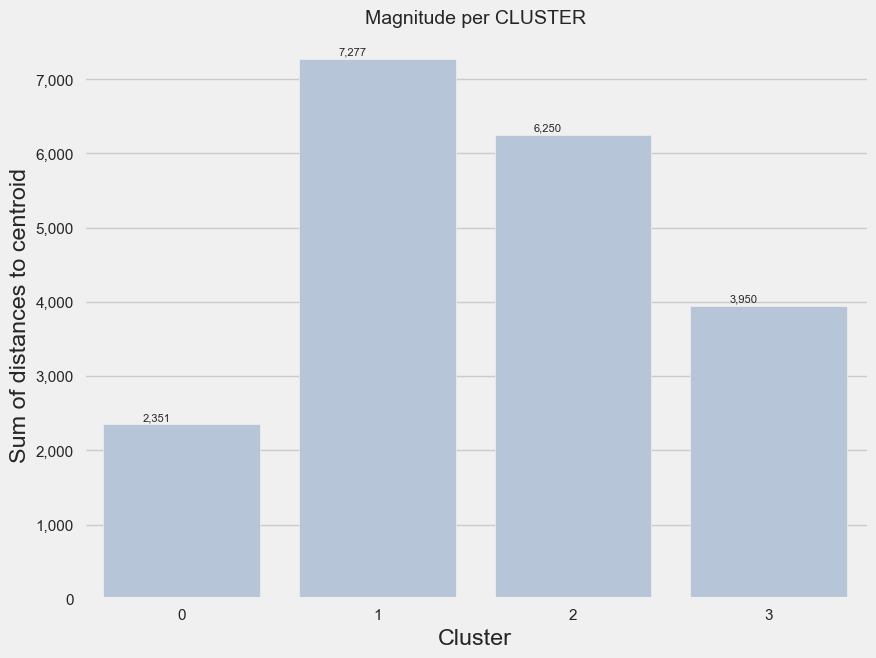

In [172]:
# Compute Magnitude of each cluster
kmeans_var['distanceToCentroid'] = np.min(centroid_distances, axis=1)
magnitude = kmeans_var['distanceToCentroid'].groupby(labels).sum()
kmeans_var = kmeans_var.drop(columns=['distanceToCentroid'])

# Visualize Magnitude per Cluster
fig, ax = plt.subplots(figsize=(9, 7))
g = sns.barplot(x=magnitude.index, y=magnitude.values, color='lightsteelblue')
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index, data in enumerate(magnitude):
    plt.text(x=index - 0.2, y=data + 50, s=f"{data:,.0f}", fontdict=dict(fontsize=8))
sns.despine()
plt.title("Magnitude per CLUSTER", fontsize=14)
plt.xlabel("Cluster")
plt.ylabel("Sum of distances to centroid")
plt.rc('axes', labelsize=8)
plt.show()

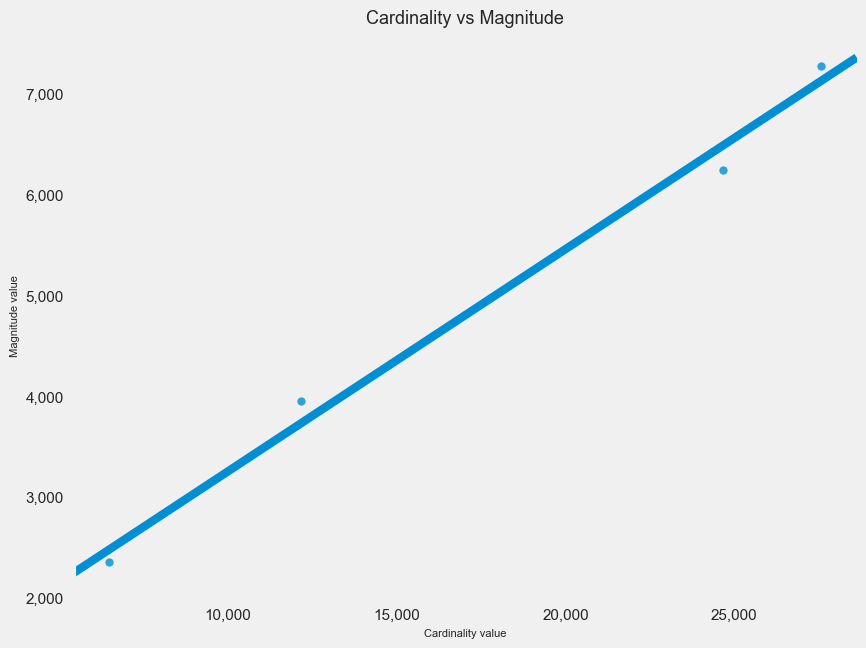

In [173]:
# Plot cardinality vs magnitude
plt.figure(figsize=(9, 7))
g = sns.regplot(x=cluster_sizes, y=magnitude, scatter=True, truncate=False, ci=None)
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
g.xaxis.set_major_formatter(tick)
g.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Cardinality vs Magnitude", fontsize=13)
plt.xlabel("Cardinality value")
plt.ylabel("Magnitude value")
plt.grid()
plt.rc('axes', labelsize=11)
plt.show()

In [174]:
r2 = r2(ds_kmeans[numeric_vars + ['Cluster']], ds_kmeans['Cluster'])
r2

0.8720479683326533

R-squared value calculated by the r2 function is 0.9161, which is quite high. This indicates that the clustering solution explains a significant portion of the variability in the data.

C:\Users\pcata\anaconda3\envs\datamining\Lib\site-packages\sklearn\manifold\_mds.py:601: UserWarning:

The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.



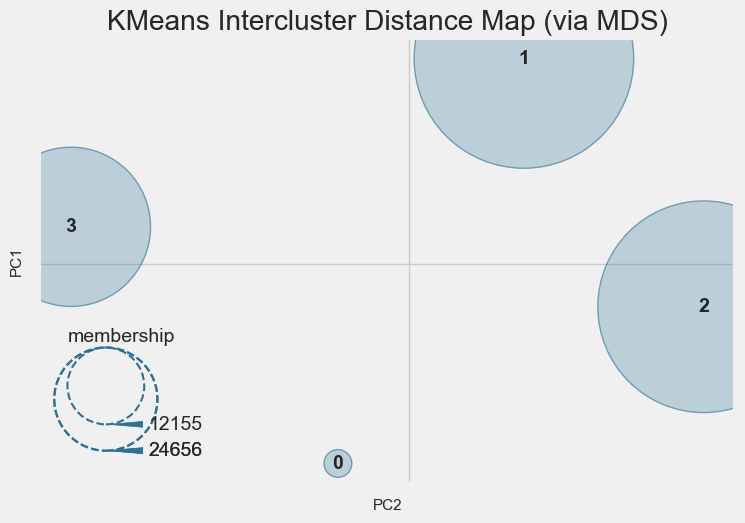

In [175]:
# trained KMeans model
cluster_size_distance(ds_kmeans, kmeans)

The clusters are distant. 

The size of the circles represent the number of points that belong to the cluster,the bigger the most observations.

Scatter plot to visualize clusters
plt.figure(figsize=(9, 7))
plt.scatter(kmeans_var.iloc[:, 0], kmeans_var.iloc[:, 1], c=labels, cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=300, c='red', label='Centroids')
plt.title('Scatter plot of Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

<a id = "Evaluation"></a>
    
## 4. Evaluation
    
[Back to Index](#Index)

Having def 

In [176]:
numerical_variables = ['Age', 'DaysSinceCreation', 'AverageLeadTime', 'LodgingRevenue', 'OtherRevenue', 
                       'BookingSuccessRate', 'TotalSpecialRequests', 'RevenuePerPersonNight', 'SpendingPerBooking', 
                       'BookingsNotAttended', 'BookingsCheckedIn', 'PersonsNights']

In [177]:
categorical_variables = ['Age Group']

In [178]:
binary_categorical_variables = ['SRHighFloor', 'SRCrib', 'SRKingSizeBed', 'SRTwinBed', 'SRQuietRoom', 
                                'Origin_North_America', 'Origin_Other_Europe', 'Origin_Others', 
                                'Origin_Portugal', 'Origin_South_America', 
                                'DistributionChannel_Corporate', 'DistributionChannel_Direct', 
                                'DistributionChannel_GDS Systems', 'DistributionChannel_Travel Agent/Operator']

In [179]:
custom_palette = ["#1f77b4", "#9467bd", "#ff7f0e", "#2ca02c"]

In [180]:
# Table for Numeric Variables
numeric_cols = ds_Encoded.select_dtypes(include='number')

# Group and calculate the mean in each cluster of the variables
cluster_means = numeric_cols.groupby(ds_Encoded['Cluster']).mean()
cluster_means

,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Cluster
Cluster,,,,,,,,,,,,,,,,,,
0,41.849560,546.711906,114.307218,1067.918461,227.190697,1.115824,12.297964,0.059840,0.022517,0.401450,0.175663,0.133560,0.999618,0.809685,143.335807,1232.665355,0.002468,0.0
1,47.733523,1046.839486,55.913324,318.851460,74.245210,1.063502,5.821934,0.044172,0.008668,0.351200,0.117937,0.079930,0.999413,0.613041,79.877961,378.901472,0.003010,1.0
2,44.493595,366.185067,44.848759,344.242532,64.651526,1.060391,5.270441,0.039301,0.013344,0.364495,0.133598,0.083266,0.999507,0.644427,92.987167,393.700309,0.001703,2.0
3,60.112631,584.165364,206.662526,347.332668,96.208072,1.034389,6.390950,0.040230,0.003538,0.365117,0.221884,0.103743,0.999918,0.746030,76.162170,434.490763,0.000165,3.0


In [181]:
# Total de clientes por país
total_clientes_por_pais = ds_kmeans[['Origin_North_America', 'Origin_Other_Europe', 'Origin_Others', 'Origin_Portugal', 'Origin_South_America']].sum()

# Agrupar por cluster e calcular o total de clientes de cada país em cada cluster
total_clientes_por_pais_por_cluster = ds_kmeans.groupby('Cluster')[['Origin_North_America', 'Origin_Other_Europe', 'Origin_Others', 'Origin_Portugal', 'Origin_South_America']].sum()

# Calcular a representatividade de cada país em cada cluster
representatividade_por_cluster = total_clientes_por_pais_por_cluster.div(total_clientes_por_pais) * 100

representatividade_por_cluster

,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America
Cluster,,,,,
0,7.716905,10.170078,8.014616,3.058020,10.209235
1,27.478150,38.181084,43.069428,49.515358,37.698413
2,42.911959,33.221102,36.004872,40.013652,34.884560
3,21.892987,18.427736,12.911084,7.412969,17.207792


In [182]:
# Group by 'Age Group' and 'Cluster', count occurrences, and calculate percentages
cluster_age_distribution = ds_kmeans.groupby(['Age Group', 'Cluster']).size() / ds_kmeans.groupby('Age Group').size()
cluster_age_distribution = cluster_age_distribution.reset_index(name='Percentage')

# Pivot the DataFrame to create a table
cluster_age_distribution_table = cluster_age_distribution.pivot_table(index='Age Group', columns='Cluster', values='Percentage', fill_value=0)
cluster_age_distribution_table = cluster_age_distribution_table.reindex(sorted(cluster_age_distribution_table.columns), axis=1)

# %
cluster_age_distribution_table = cluster_age_distribution_table.applymap(lambda x: '{:.0f}%'.format(x * 100))
cluster_age_distribution_table

Cluster,0,1,2,3
Age Group,,,,
Adult (26-40),11%,41%,44%,5%
Middle Age (41-60),9%,41%,35%,16%
Senior (61-100),4%,34%,21%,41%
Young Adult (18-25),25%,29%,44%,2%


- 44% of Adult (26-40) clients are in Cluster 2 and 41% Cluster 1
- 41% of Middle Age (41-60)	clients are in cluster 1
- 41% of Senior (61-100) clients are in cluster 3
- 44% Young Adult (18-25) are in the cluster 1, being the most well represented in cluster 0 - younger cluster

Young Adults seem to be the only group with great representation in cluster 0
Seniors are the ones with great representation in cluster 3

Can this be liked to the amount spent? days since creation?... Lets investigate.

In [183]:
# Group by 'Age Group' and 'Cluster' & count occurrences
cluster_age_distribution = ds_kmeans.groupby(['Cluster', 'Age Group']).size() / ds_kmeans.groupby('Cluster').size()


cluster_age_distribution = cluster_age_distribution.reset_index(name='Percentage')
# Pivot the DataFrame to create a table
cluster_age_distribution_table = cluster_age_distribution.pivot_table(index='Cluster', columns='Age Group', values='Percentage', fill_value=0)
cluster_age_distribution_table = cluster_age_distribution_table.reindex(sorted(cluster_age_distribution_table.columns), axis=1)

# %
cluster_age_distribution_table = cluster_age_distribution_table.applymap(lambda x: '{:.0f}%'.format(x * 100))
cluster_age_distribution_table


Age Group,Adult (26-40),Middle Age (41-60),Senior (61-100),Young Adult (18-25)
Cluster,,,,
0,32%,46%,8%,13%
1,29%,50%,18%,4%
2,35%,47%,12%,6%
3,7%,43%,49%,0%


- Cluster 0: 46% is Middle Age (41-60) and 32%  is Adult (26-40)
- Cluster 1: 50% is Middle Age (41-60) 
- Cluster 2: 47% is Middle Age (41-60) 35 %  is Adult (26-40)
- Cluster 3: 49% is Senior (61-100) and 0% of Young Adult (18-25)

Cluster 3 is indeed for our most Senior customers excluding the younger ones. In terms of Marketing they can be more difficult to approach since they are not so online. This clients tend to prefer more attention, see the generation and serach for caracteristics 
Cluster 3 consists of senior customers, in terms of Marketing can be more difficult since they may not be as tech-savvy and prefer more personalized attention. These characteristics are often associated with the Baby Boomer generation (born approximately between 1946 and 1964) or the Silent Generation (born approximately between 1928 and 1945). These generations generally have less familiarity with online technology compared to younger generations (and this cluster has 0% of Young Adults): https://blog.nic.org/boomer-vs-silent-generation more search for marketing startegies

Is also possible that this clients are more loyal if we prodide a quality and close service. Possibly they have more money

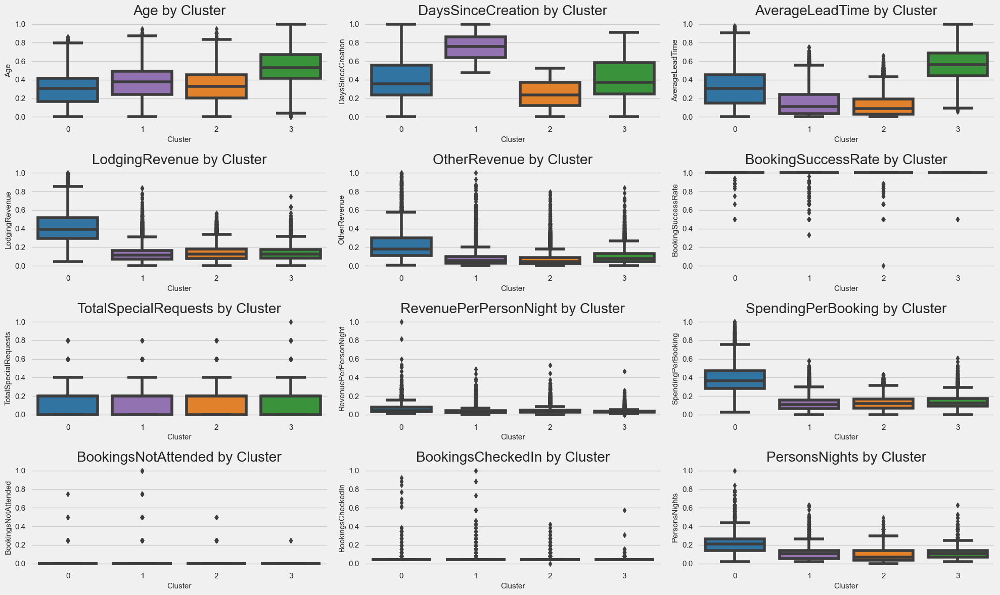

In [184]:
num_cols = 3
num_rows = (len(numerical_variables) + num_cols - 1) // num_cols

plt.figure(figsize=(20, 12))
for i, var in enumerate(numerical_variables, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(x='Cluster', y=var, data=ds_kmeans, palette=custom_palette)
    plt.title(f'{var} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(var)

plt.tight_layout()
plt.show()

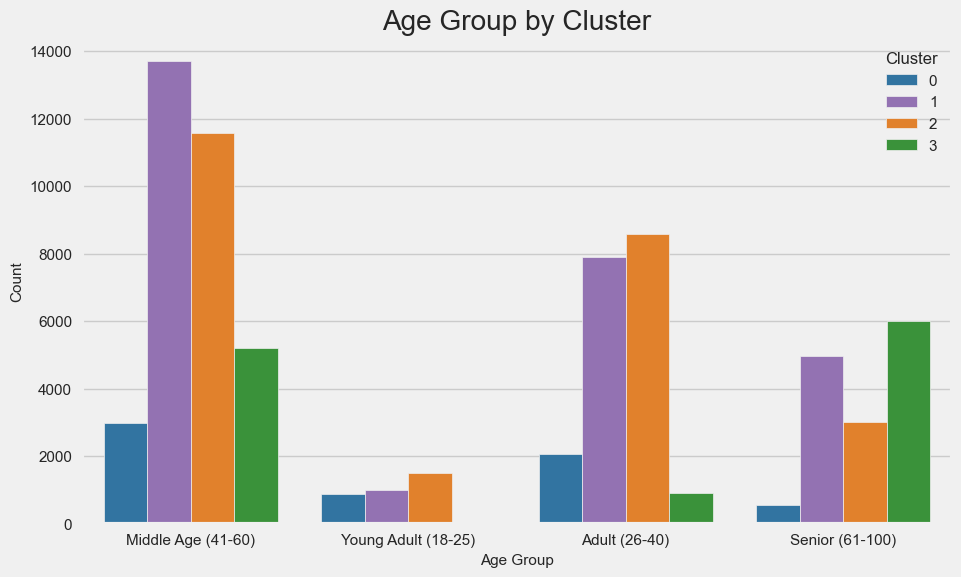

In [185]:
for var in categorical_variables:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=var, hue='Cluster', data=ds_kmeans, palette=custom_palette)
    plt.title(f'{var} by Cluster')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Cluster')
    plt.show()

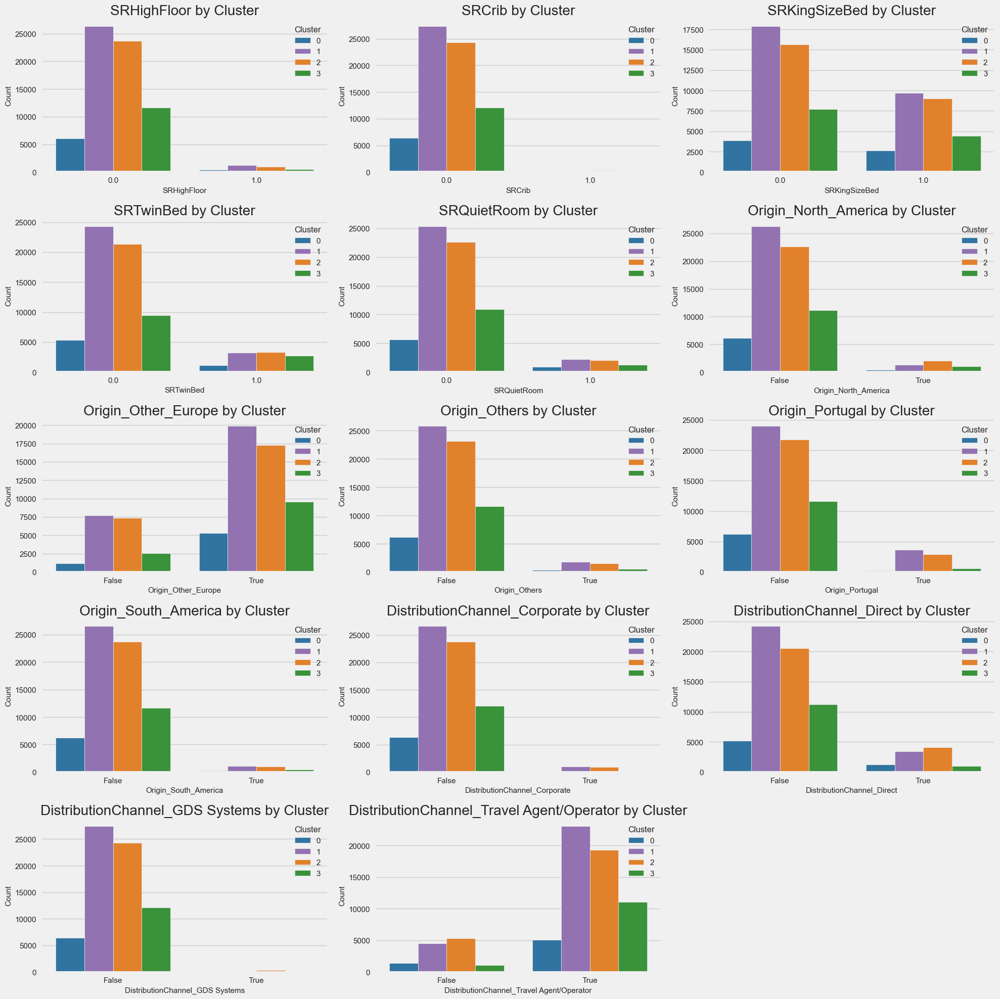

In [186]:
num_cols = 3
num_rows = (len(binary_categorical_variables) + num_cols - 1) // num_cols


plt.figure(figsize=(20, 20))
for i, var in enumerate(binary_categorical_variables, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.countplot(x=var, hue='Cluster', data=ds_kmeans, palette=custom_palette)
    plt.title(f'{var} by Cluster')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()



<Figure size 800x400 with 0 Axes>

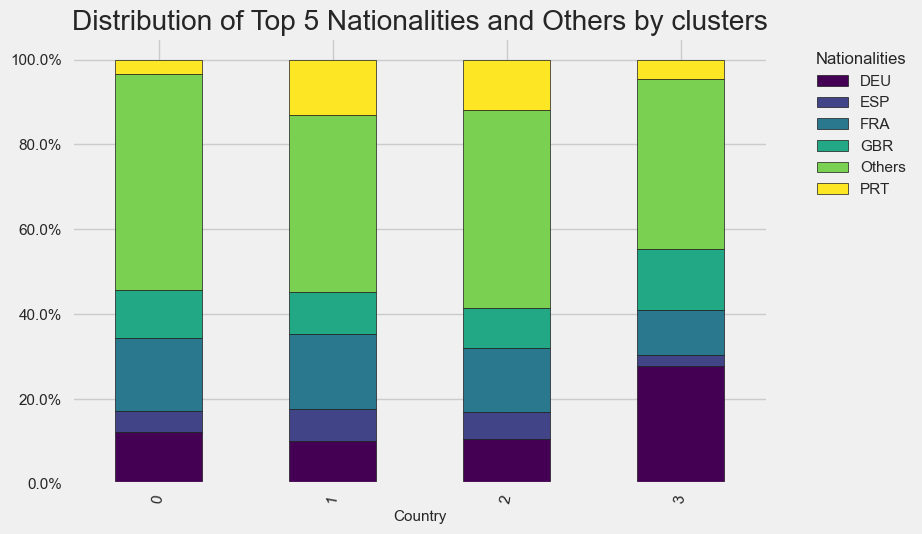

In [187]:
# Identificar os cinco principais países
top_5_nationalities = ds_Encoded['Nationality'].value_counts().head(5).index

# Substituir nacionalidades não pertencentes aos cinco principais por "Others"
ds_Encoded.loc[~ds_Encoded['Nationality'].isin(top_5_nationalities), 'Nationality'] = 'Others'

# Agrupar os dados por cluster e nacionalidade
nat_vs_segment = ds_Encoded.groupby(['Cluster', 'Nationality']).size().unstack()

# Calcular as porcentagens
rating_percentages = nat_vs_segment.div(nat_vs_segment.sum(axis=1), axis=0) * 100

# Plotar o gráfico de barras empilhadas
plt.figure(figsize=(8, 4))
ax = rating_percentages.plot(kind='bar', stacked=True, edgecolor='k', cmap='viridis')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=1))
plt.title('Distribution of Top 5 Nationalities and Others by clusters')
plt.xlabel('Country')
plt.xticks(rotation=80)
plt.legend(title='Nationalities', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [188]:
# Assuming you have performed clustering and assigned cluster labels to your DataFrame df
# Assuming 'Revenue' is the column representing revenue in your DataFrame

# Calculate total revenue for each cluster
cluster_total_revenue = ds_kmeans.groupby('Cluster')['LodgingRevenue'].sum().reset_index(name='totalRevenue')

# Calculate percentage of revenue for each cluster
cluster_percentages = pd.merge(ds_kmeans, cluster_total_revenue, on='Cluster')
cluster_percentages['percentage'] = (cluster_percentages['LodgingRevenue'] / cluster_percentages['totalRevenue']) * 100

# Pivot the DataFrame to create a DataFrame where each column represents a revenue category and each row represents a cluster
cluster_percentages_pivot = cluster_percentages.pivot_table(index='Cluster', columns='RevenueCategory', values='percentage', aggfunc='sum')

# Plot the stacked bar chart
plt.figure(figsize=(15, 6))
ax = cluster_percentages_pivot.plot(kind='bar', stacked=True, edgecolor='k')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=1))  
plt.title('Percentage of Revenue for Clusters')
plt.xlabel('Cluster')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.legend(title='Revenue Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

KeyError: 'RevenueCategory'

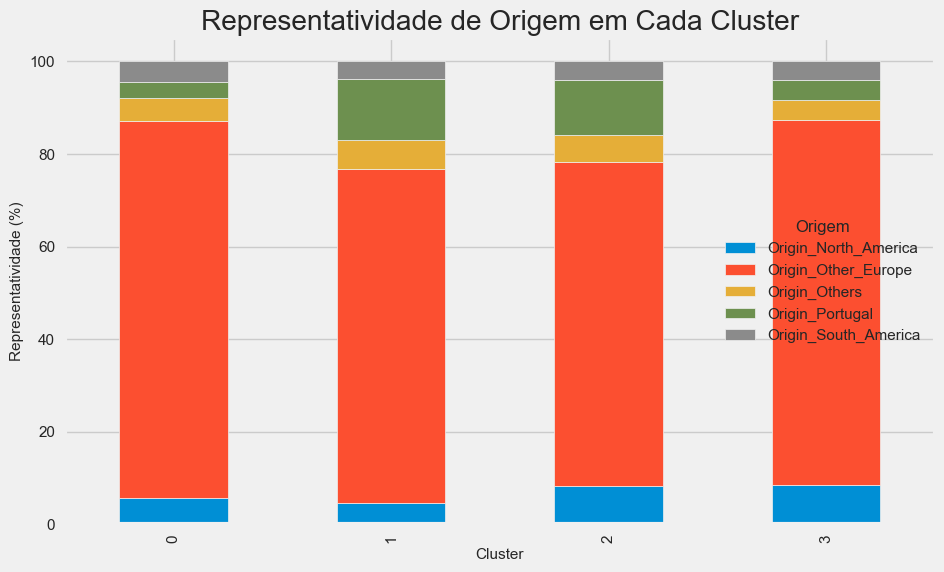

In [189]:
# Calcular o total de entradas em cada cluster
total_clientes_por_cluster = ds_kmeans.groupby('Cluster').size()

# Calcular o total de cada país dentro de cada cluster
total_clientes_por_pais_por_cluster = ds_kmeans.groupby('Cluster')[['Origin_North_America', 'Origin_Other_Europe', 'Origin_Others', 'Origin_Portugal', 'Origin_South_America']].sum()

# Calcular a representatividade de cada país em cada cluster
representatividade_por_cluster = total_clientes_por_pais_por_cluster.div(total_clientes_por_cluster, axis=0) * 100

# Plotar
fig, ax = plt.subplots(figsize=(10, 6))

# Gráfico de barras empilhadas
representatividade_por_cluster.plot(kind='bar', stacked=True, ax=ax)

# Adicionar rótulos e título
ax.set_ylabel('Representatividade (%)')
ax.set_xlabel('Cluster')
ax.set_title('Representatividade de Origem em Cada Cluster')

# Adicionar legenda
ax.legend(title='Origem')

plt.show()


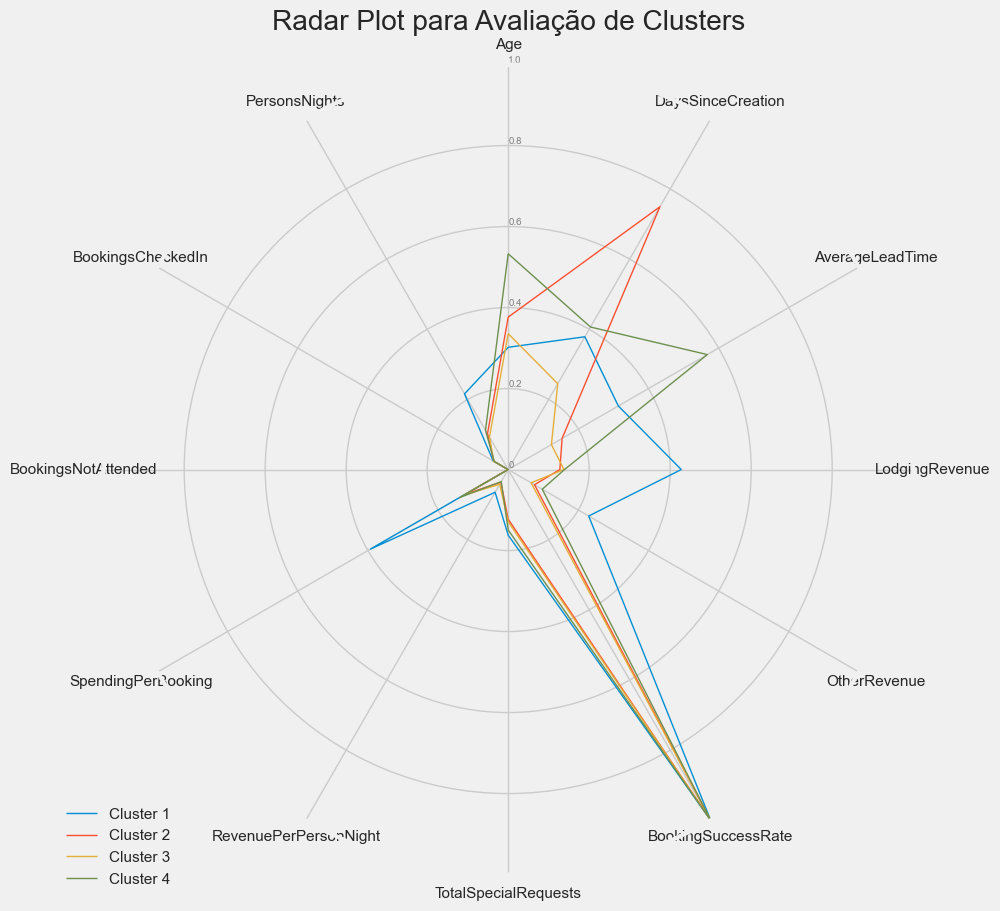

In [190]:
num_vars = len(numerical_variables)

# Suponha que 'ds_kmeans' seja o seu DataFrame contendo os dados dos clusters
# Substitua esta parte com seus próprios dados
num_clusters = len(ds_kmeans['Cluster'].unique())
cluster_data = ds_kmeans.groupby('Cluster')[numerical_variables].mean().values

# Calcule os ângulos para o radar plot
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

# Feche o gráfico para que seja um polígono completo
cluster_data = np.concatenate((cluster_data, cluster_data[:,[0]]), axis=1)

# Plote os radar plots
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
for i in range(num_clusters):
    ax.plot(angles, cluster_data[i], linewidth=1, linestyle='solid', label=f'Cluster {i+1}')
    
# Adicione legendas
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_rlabel_position(0)
plt.xticks(angles[:-1], numerical_variables)
plt.yticks(np.arange(0, 1.2, 0.2), ['0', '0.2', '0.4', '0.6', '0.8', '1.0'], color="grey", size=7)
plt.ylim(0, 1)
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

# Adicione um título
plt.title('Radar Plot para Avaliação de Clusters')

# Mostrar o gráfico
plt.show()


In [191]:
#ver a cinstituição do cluster....e ver onde ta frnaça e alemanha ( juntar nationality) fazer o mesmo para age group

In [192]:
#fazer um grafico barras com percentagem para cada cluster.......

In [194]:
ds_kmeans

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCheckedIn,PersonsNights,SRHighFloor,SRCrib,SRKingSizeBed,SRTwinBed,SRQuietRoom,BookingSuccessRate,TotalSpecialRequests,RevenuePerPersonNight,SpendingPerBooking,BookingsNotAttended,Age Group,Origin_North_America,Origin_Other_Europe,Origin_Others,Origin_Portugal,Origin_South_America,DistributionChannel_Corporate,DistributionChannel_Direct,DistributionChannel_GDS Systems,DistributionChannel_Travel Agent/Operator,PCA_Component_1,PCA_Component_2,PCA_Component_3,PCA_Component_4,PCA_Component_5,Cluster
0,BRA,0.417722,0.125278,0.112637,0.166731,0.274242,0.038462,0.175439,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.031082,0.219404,0.0,Middle Age (41-60),False,False,False,False,True,False,False,False,True,0.346413,-0.100184,0.052116,0.156309,0.045780,2
1,CHE,0.088608,0.646405,0.181319,0.153661,0.059091,0.038462,0.140351,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.024983,0.141081,0.0,Young Adult (18-25),False,True,False,False,False,False,True,False,False,-0.169838,-0.145653,0.137927,-0.220247,-0.128941,1
2,FRA,0.265823,0.455893,0.065934,0.093637,0.028283,0.038462,0.070175,0.0,0.0,0.0,1.0,1.0,1.0,0.4,0.029584,0.083533,0.0,Adult (26-40),False,True,False,False,False,False,False,False,True,-0.001716,-0.203467,-0.008322,-0.056284,0.285838,2
4,DEU,0.303797,0.400297,0.021978,0.172869,0.021212,0.038462,0.052632,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.068202,0.144429,0.0,Middle Age (41-60),False,True,False,False,False,False,False,False,True,0.041184,-0.245764,-0.018172,0.016501,-0.120693,2
5,FRA,0.151899,0.885100,0.304945,0.164066,0.113131,0.038462,0.105263,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.039295,0.166428,0.0,Adult (26-40),False,True,False,False,False,False,False,False,True,-0.381372,0.032200,0.164744,-0.218092,-0.136079,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104796,GBR,0.734177,0.243884,0.057692,0.125650,0.075758,0.038462,0.070175,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.043925,0.124024,0.0,Senior (61-100),False,True,False,False,False,False,False,False,True,0.193567,-0.050633,-0.241521,0.334602,0.083938,2
104798,AUS,0.215190,0.610823,0.054945,0.166467,0.056566,0.038462,0.140351,0.0,0.0,1.0,0.0,0.0,1.0,0.2,0.026649,0.150486,0.0,Adult (26-40),False,False,True,False,False,False,False,False,True,-0.146500,-0.195653,0.110599,-0.051170,0.073522,1
104799,AUT,0.354430,0.665678,0.032967,0.146459,0.021212,0.038462,0.052632,0.0,0.0,0.0,0.0,1.0,1.0,0.2,0.058266,0.123386,0.0,Middle Age (41-60),False,True,False,False,False,False,False,False,True,-0.213756,-0.167680,-0.005673,0.036944,0.085819,1
104800,ESP,0.240506,0.242402,0.054945,0.246098,0.072222,0.038462,0.175439,0.0,0.0,0.0,1.0,0.0,1.0,0.2,0.031007,0.218875,0.0,Adult (26-40),False,True,False,False,False,True,False,False,False,0.228349,-0.221005,0.141024,0.024623,0.052485,2


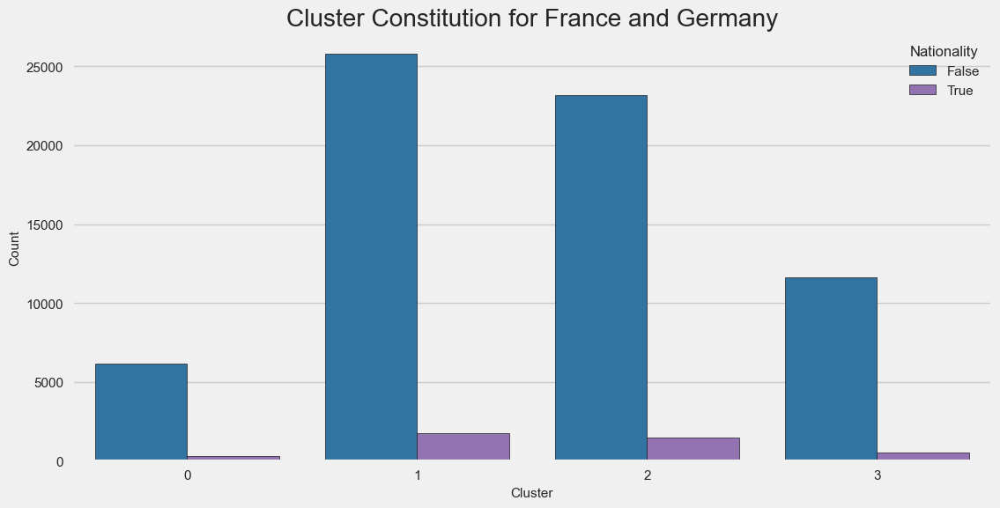

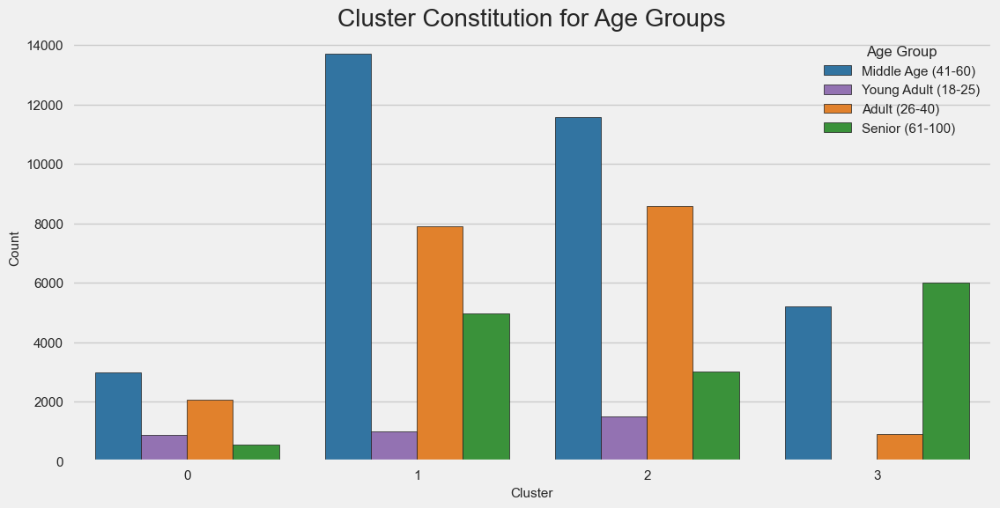

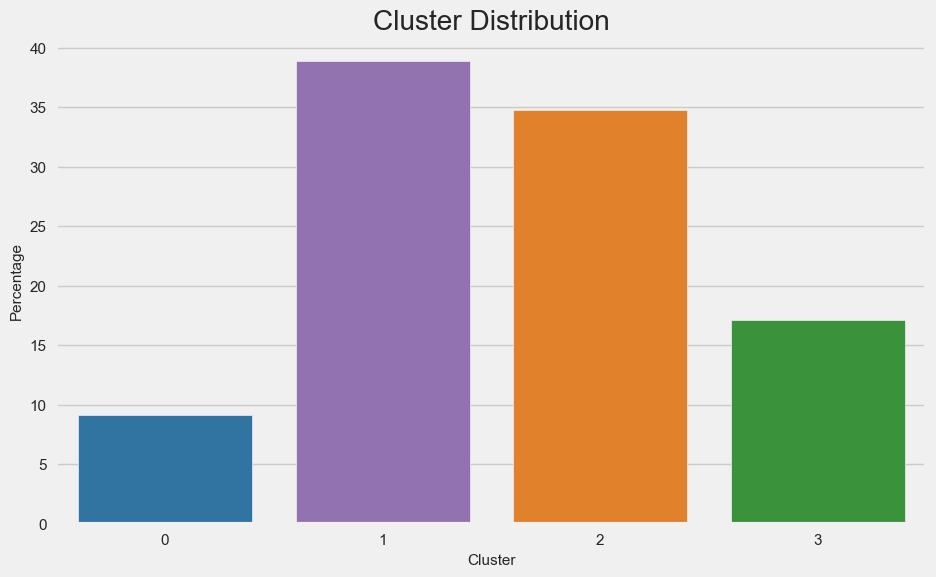

In [195]:
# Plot the cluster constitution for France and Germany
nationalities_to_plot = ['Origin_Others']

plt.figure(figsize=(12, 6))
for nationality in nationalities_to_plot:
    sns.countplot(x='Cluster', data=ds_kmeans, hue=nationality, palette=custom_palette, edgecolor='k')

plt.title('Cluster Constitution for France and Germany')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Nationality')
plt.show()

# Plot the cluster constitution for age groups
plt.figure(figsize=(12, 6))
sns.countplot(x='Cluster', data=ds_kmeans, hue='Age Group', palette=custom_palette, edgecolor='k')

plt.title('Cluster Constitution for Age Groups')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Age Group')
plt.show()

# Create a bar chart with percentages for each cluster
cluster_distribution = ds_kmeans['Cluster'].value_counts(normalize=True) * 100

plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette=custom_palette)

plt.title('Cluster Distribution')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.show()

<a id = "Evaluation"></a>
    
## 5. Deployment
    
[Back to Index](#Index)

In [199]:
marketing_strategies = {
    0: ["Target younger audience with social media ads", "Offer discounts for frequent purchases"],
    1: ["Focus on luxury branding and personalized service", "Host exclusive events for high-value customers"],
    2: ["Highlight cultural diversity in marketing materials", "Offer multilingual customer support"],
    3: ["Highlight cultural diversity in marketing materials", "Offer multilingual customer support"]
}

In [200]:
def assign_to_cluster(client_info):
    client_features = [[client_info['age'], client_info['nationality']]]  # Example with only age and nationality
    cluster = kmeans_model.predict(client_features)[0]
    return cluster

def get_marketing_strategy(cluster):
    return marketing_strategies.get(cluster, "Unknown cluster")

In [201]:
# Put user inputs for client information
age = int(input("Enter client's age: "))
nationality = input("Enter client's nationality: ")

# Create client information dictionary
client_info = {
    'age': age,
    'Origin: Portugal, ': nationality,
    
}

# Assign client to cluster
assigned_cluster = assign_to_cluster(client_info)

# Retrieve marketing strategy for the assigned cluster
marketing_strategy = get_marketing_strategy(assigned_cluster)

# Output marketing strategy bullet points
print("Marketing Strategy for Cluster", assigned_cluster)
for bullet_point in marketing_strategy:
    print("-", bullet_point)

Enter client's age: 28
Enter client's nationality: PT


KeyError: 'nationality'

In [204]:
# Put user inputs for client information
age = int(input("Enter client's age: "))
nationality = input("Enter client's nationality: ")

# Create client information dictionary
client_info = {
    'age': age,
    'Origin: Portugal, ': nationality,
    
}

# Assign client to cluster
assigned_cluster = assign_to_cluster(client_info)

# Retrieve marketing strategy for the assigned cluster
marketing_strategy = get_marketing_strategy(assigned_cluster)

# Output marketing strategy bullet points
print("Marketing Strategy for Cluster", assigned_cluster)
for bullet_point in marketing_strategy:
    print("-", bullet_point)


Enter client's age: 28
Enter client's nationality: BR


KeyError: 'nationality'